## Import libraries

In [ ]:
# Nhập các thư viện cần thiết
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import matplotlib as mpl
import networkx as nx

In [ ]:
# Tắt cảnh báo "chained assignment" để tránh các thông báo không cần thiết khi thay đổi dữ liệu
pd.options.mode.chained_assignment = None

## Import data

- train, train_y, test, test_y

In [ ]:
train = pd.read_csv('prediction_log/train_log.csv')  # Dữ liệu log của tập huấn luyện
train_y = pd.read_csv('prediction_log/train_truth.csv')  # Nhãn của tập huấn luyện
test = pd.read_csv('prediction_log/test_log.csv')  # Dữ liệu log của tập kiểm tra
test_y = pd.read_csv('prediction_log/test_truth.csv')  # Nhãn của tập kiểm tra

- course_info, user_info

In [ ]:
course_info = pd.read_csv('course_info.csv')  # Dữ liệu thông tin khóa học
user_info = pd.read_csv('user_info.csv')  # Dữ liệu thông tin người dùng

In [ ]:
train.head()

,enroll_id,username,course_id,session_id,action,object,time
0,772,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_about,NaN,2015-09-27T15:42:59
1,772,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_info,NaN,2015-09-27T15:43:12
2,773,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,pause_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:37:42
3,773,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,load_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:33:27
4,773,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,play_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:33:30


In [ ]:
train_y.head()

,enroll_id,truth
0,772,1
1,773,1
2,774,1
3,776,0
4,777,1


In [ ]:
course_info.head()

,id,course_id,start,end,course_type,category
0,6561,course-v1:CPVS+CPVS-HDLSC001+20160901,2016-11-16 08:00:00,2016-12-31 23:30:00,0,NaN
1,5557,course-v1:SCUT+144282+201709,2016-09-01 00:00:00,2017-02-28 00:00:00,0,NaN
2,9433,course-v1:ZK+06093+J,2018-01-01 08:00:00,2020-01-01 00:00:00,0,NaN
3,8320,course-v1:nuist+001+2016-T1,2017-03-01 18:30:00,2017-07-01 23:30:00,0,NaN
4,231,FUDAN/CFD004/2014.9-2015.1,2014-09-10 08:00:00,2015-09-10 00:00:00,0,NaN


In [ ]:
user_info.head()

,user_id,gender,education,birth
0,631,male,High,1997.0
1,2631,male,Bachelor's,1990.0
2,4231,male,Associate,1991.0
3,6031,male,Bachelor's,1988.0
4,7831,NaN,NaN,NaN


## EDA

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Thiết lập phong cách hiển thị đồ thị
plt.style.use('fivethirtyeight')  # Phong cách đồ thị tương tự như FiveThirtyEight
plt.rcParams.update({'font.size': 10})  # Cập nhật kích thước chữ mặc định

In [ ]:
# Kết hợp dữ liệu từ nhiều bảng để chuẩn bị cho phân tích
eda_info = train_y.merge(
    train.merge(user_info, left_on='username', right_on='user_id', how='left'),
    on='enroll_id'
)

In [ ]:
# Hiển thị 5 dòng đầu tiên của dữ liệu
eda_info.head()

,enroll_id,truth,username,course_id,session_id,action,object,time,user_id,gender,education,birth
0,772,1,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_about,NaN,2015-09-27T15:42:59,5981,male,Master's,1989.0
1,772,1,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_info,NaN,2015-09-27T15:43:12,5981,male,Master's,1989.0
2,773,1,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,pause_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:37:42,1544995,NaN,NaN,NaN
3,773,1,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,load_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:33:27,1544995,NaN,NaN,NaN
4,773,1,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,play_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:33:30,1544995,NaN,NaN,NaN


### Summary Statistics

- Làm sạch dữ liệu, xử lý dữ liệu thô cho bộ test. Đồng thời loại bỏ các cột không cần thiết tránh ảnh hưởng đến độ chính xác khi kiểm tra mô hình và đồ thị

In [ ]:
# Loại bỏ các dòng chứa giá trị bị thiếu trong user_info
user_info_nona = user_info.dropna()

# Loại bỏ các dòng chứa giá trị bị thiếu ở cột 'category' trong course_info
course_info_nona = course_info.dropna(subset=['category'])

- Trực quan số liệu trong bộ test

In [ ]:
# Đếm tổng số người dùng có nhãn trong dữ liệu
print('Total Users (Labeled): ' + str(len(eda_info['user_id'].unique())))

# Đếm tổng số lượt đăng ký khóa học
print('Total Enrollments: ' + str(len(train['enroll_id'].unique())))

# Đếm tổng số khóa học có nhãn trong dữ liệu
print('Total Courses (Labeled): ' + str(len(course_info_nona)))

Total Users (Labeled): 69823
Total Enrollments: 157943
Total Courses (Labeled): 1454


- Kiểm tra xem mức độ phân phối của biến truth trong bộ dữ liệu, ở đây biến truth mang giá trị 1 là sinh viên  bỏ học, 0 là sinh viên còn đi học

In [ ]:
# Phân phối của cột 'truth' trong tập huấn luyện
train_y['truth'].value_counts()

truth
1    119817
0     38126
Name: count, dtype: int64

### Demographics

In [ ]:
Trực quan hóa bộ dữ liệu

#### Gender

- Biểu đồ thể hiện giới tính của từng nhóm dữ liệu khi chia theo khả năng bỏ học

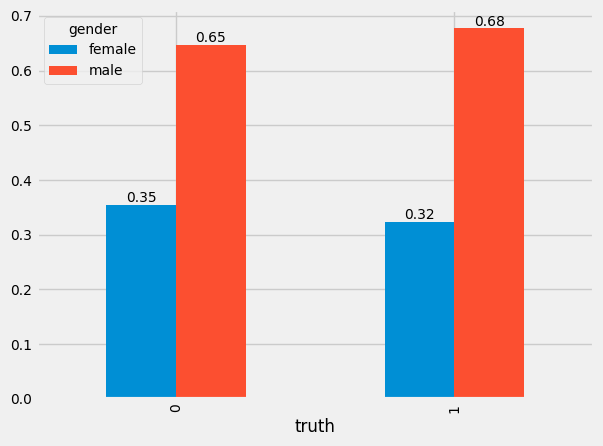

In [ ]:
# Vẽ biểu đồ so sánh giới tính dựa trên nhãn 'truth'
ax = pd.crosstab(eda_info['truth'], eda_info['gender'], normalize='index').plot(kind='bar')

# Thêm nhãn giá trị lên các cột trong biểu đồ
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

Biểu đồ cho thấy tỷ lệ bỏ học ở nam cao gấp đôi so với ở nữ, nguyên nhân có thể do thói quen của người nam cũng như tính cách và mức chăm chỉ của người nam thấp hơn nữ

In [ ]:
# Tính tuổi của người dùng dựa trên năm hiện tại và năm sinh
eda_info['age'] = int(max(eda_info['time'])[:4]) - eda_info['birth']

# Tính tuổi trung bình của người dùng theo nhãn 'truth'
eda_info.groupby('truth')['age'].mean()

truth
0    27.943659
1    27.504832
Name: age, dtype: float64

#### Education

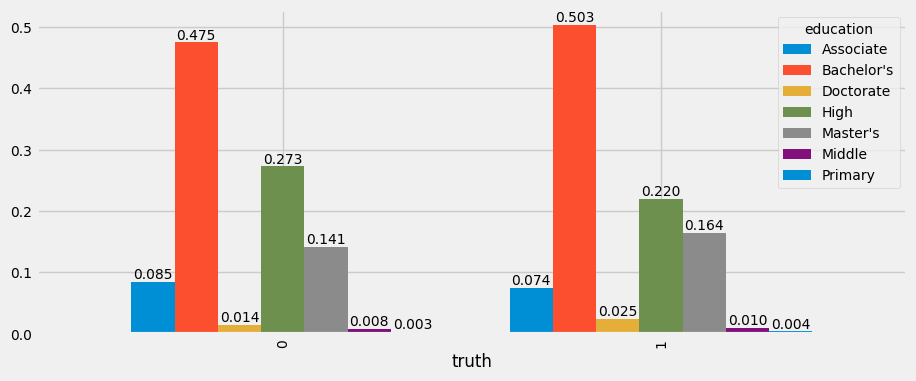

In [ ]:
# Vẽ biểu đồ so sánh trình độ học vấn theo nhãn 'truth'
ax = pd.crosstab(eda_info['truth'], eda_info['education'], normalize='index').plot(kind='bar', figsize=(10, 4), width=0.8)

# Thêm nhãn giá trị lên các cột trong biểu đồ
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f')

**Ý nghĩa của Biểu đồ


Biểu đồ so sánh mức độ bỏ học giữa những người có trình độ học vấn khác nhau. trong bộ dữ liệu có thể thấy những người có bằng thạc sĩ chiếm gấp đôi hoặc hơn so với trình độ khác, những học viên ở mức trung bình chiếm khá ít

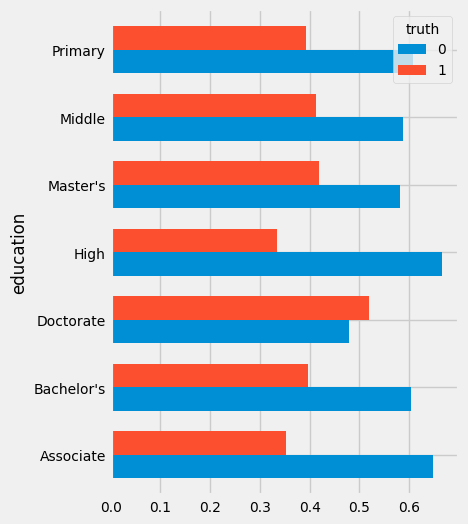

In [ ]:
# Vẽ biểu đồ ngang so sánh nhãn 'truth' theo trình độ học vấn
ax = pd.crosstab(eda_info['education'], eda_info['truth'], normalize='index').plot(kind='barh', figsize=(4, 6), xlabel='', width=0.7)

# Tùy chỉnh trục x không xoay nhãn
ax.tick_params(axis='x', rotation=0)

Biểu đồ thanh ngang này giúp bạn so sánh sự phân bố của biến 'truth' theo từng mức độ giáo dục khác nhau. Cụ thể:

Sự phân bố theo giáo dục: Biểu đồ hiển thị tỷ lệ các giá trị của 'truth' trong từng mức độ giáo dục. Ví dụ, nếu 'truth' có các giá trị True và False, biểu đồ sẽ cho thấy tỷ lệ True và False trong mỗi mức độ giáo dục.
Phân tích mối quan hệ: Nếu tỷ lệ của 'truth' thay đổi đáng kể theo từng mức độ giáo dục, có thể có một mối quan hệ giữa trình độ học vấn và biến 'truth'.

#### Actions
trực quan hóa số liệu hành động qua biến truth

In [ ]:
# Phân tích tần suất hành động theo nhỳm nhãn 'truth' (tính tần suất tương đối cho 10 hành động đầu tiên theo 'truth')
eda_info.groupby('truth')['action'].value_counts(normalize=True).groupby('truth').head(10)

truth  action          
0      stop_video          0.202946
       click_courseware    0.143389
       pause_video         0.142558
       play_video          0.115834
       problem_get         0.079033
       close_courseware    0.070587
       load_video          0.070382
       seek_video          0.057572
       problem_check       0.028489
       click_info          0.022398
1      stop_video          0.170892
       pause_video         0.146718
       click_courseware    0.125185
       play_video          0.119170
       problem_get         0.083363
       load_video          0.076713
       seek_video          0.068139
       close_courseware    0.067048
       problem_check       0.030900
       click_info          0.029394
Name: proportion, dtype: float64

In [ ]:
# Tạo nhóm hành động theo danh mục (dựa vào dictionary)
action_dict = {
    'video': ['seek_video','play_video','pause_video','stop_video','load_video'],
    'problem': ['problem_get','problem_check','problem_save','reset_problem','problem_check_correct','problem_check_incorrect'],
    'forum': ['create_thread','create_comment','delete_thread','delete_comment','click_forum','close_forum'],
    'info': ['click_info','click_about','click_progress'],
    'courseware': ['click_courseware','close_courseware']
}

# Đảo ngược dictionary action_dict để thay thế nhóm hành động
action_dict_inv = {v: k for k, values in action_dict.items() for v in values}

Action_dict cho phép nhóm các hành động chi tiết vào các danh mục lớn, giúp đơn giản hóa dữ liệu và dễ dàng phân tích hành vi người dùng ở cấp độ cao hơn.

Action_dict_inv giúp dễ dàng tìm kiếm danh mục lớn từ một hành động cụ thể, rất hữu ích nếu bạn muốn nhanh chóng phân loại hoặc nhóm hành động cụ thể vào các danh mục lớn trong quá trình xử lý hoặc phân tích dữ liệu.

In [ ]:
# Thay thế các hành động trong eda_info['action'] bằng nhóm tương ứng
eda_info['action_group'] = eda_info['action'].replace(action_dict_inv)

In [ ]:
# Hiển thị 5 dòng dữ liệu ban đầu
eda_info.head()

,enroll_id,truth,username,course_id,session_id,action,object,time,user_id,gender,education,birth,age,action_group
0,772,1,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_about,NaN,2015-09-27T15:42:59,5981,male,Master's,1989.0,28.0,info
1,772,1,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_info,NaN,2015-09-27T15:43:12,5981,male,Master's,1989.0,28.0,info
2,773,1,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,pause_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:37:42,1544995,NaN,NaN,NaN,NaN,video
3,773,1,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,load_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:33:27,1544995,NaN,NaN,NaN,NaN,video
4,773,1,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,play_video,3dac5590435e43b3a65a9ae7426c16db,2015-10-19T19:33:30,1544995,NaN,NaN,NaN,NaN,video


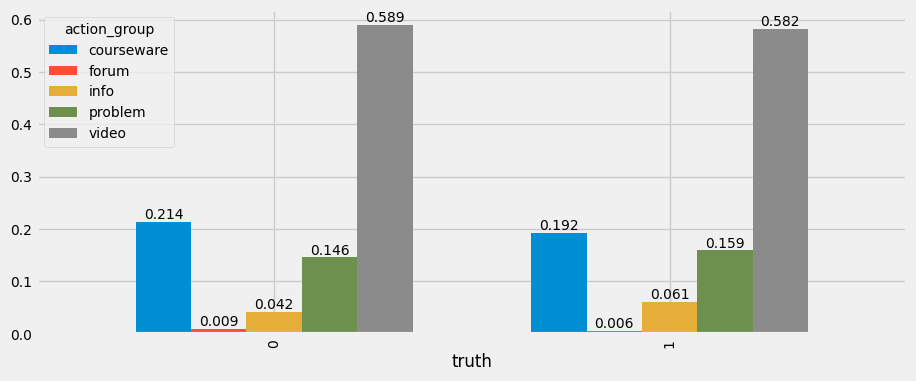

In [ ]:
# Vẽ biểu đồ tần suất hành động theo nhóm nhãn 'truth'
ax = pd.crosstab(eda_info['truth'], eda_info['action_group'], normalize='index').plot(kind='bar', figsize=(10,4), width=0.7)

# Thêm nhãn giá trị cho từng cột trong biểu đồ
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f')

Biểu đồ cột này sẽ hiển thị tỷ lệ phần trăm của các nhóm hành động cho từng giá trị của cột truth.
So sánh tỷ lệ của các nhóm hành động khác nhau đối với từng giá trị của truth. Có thể thấy rằng mức độ tương tác đối với video là rất nhiều. Chứng tỏ việc researching của người học thông qua hoạt ảnh nhiều hơn so với tìm kiếm thông tin chính thống trên forum hay infor

In [ ]:
# Tính tần suất hành động trung bình theo 'truth'
actions_truth = eda_info.groupby(['truth', 'enroll_id'])['action'].count().reset_index()
actions_truth.groupby('truth')['action'].mean()

truth
0    472.342024
1     93.117237
Name: action, dtype: float64

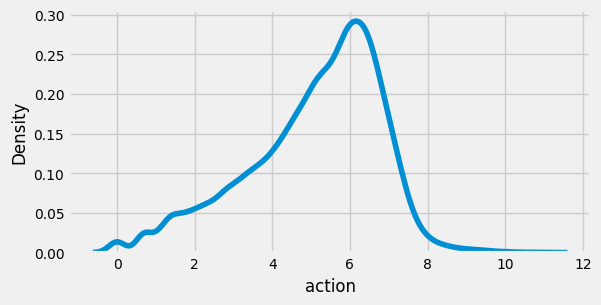

In [ ]:
# Biểu đồ KDE của log tần suất hành động cho nhóm truth = 0
plt.figure(figsize=(6, 3))
ax = sns.kdeplot(np.log(actions_truth[actions_truth['truth'] == 0]['action']))

Biểu đồ KDE này sẽ hiển thị hình dạng của phân phối số lượng hành động (sau khi đã lấy logarithm) cho các bản ghi mà truth có giá trị bằng 0.Phân phối của số lượng hành động trong nhóm truth bằng 0. Nếu phân phối có đỉnh rõ ràng, điều này cho thấy có một số giá trị hành động phổ biến; ngược lại, nếu phân phối trải dài, điều này cho thấy sự biến đổi lớn trong số lượng hành động.

<Axes: xlabel='action', ylabel='Density'>

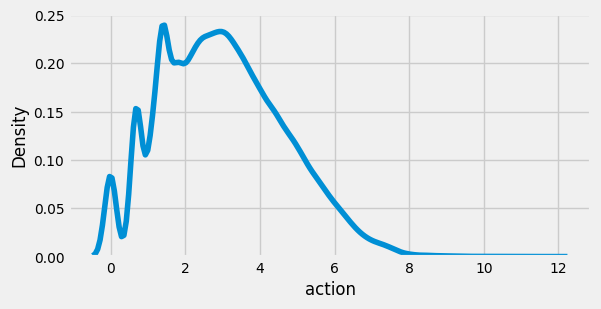

In [ ]:
# Biểu đồ KDE của log tần suất hành động cho nhóm truth = 1
plt.figure(figsize=(6, 3))
sns.kdeplot(np.log(actions_truth[actions_truth['truth'] == 1]['action']))

Biểu đồ KDE này sẽ hiển thị hình dạng của phân phối số lượng hành động (sau khi đã lấy logarithm) cho các bản ghi mà truth có giá trị bằng 1.
Phân phối của số lượng hành động trong nhóm truth bằng 1. Tương tự như biểu đồ trước đó, nếu phân phối có đỉnh rõ ràng, điều này cho thấy có một số giá trị hành động phổ biến; nếu phân phối trải dài, điều này cho thấy sự biến đổi lớn trong số lượng hành động.


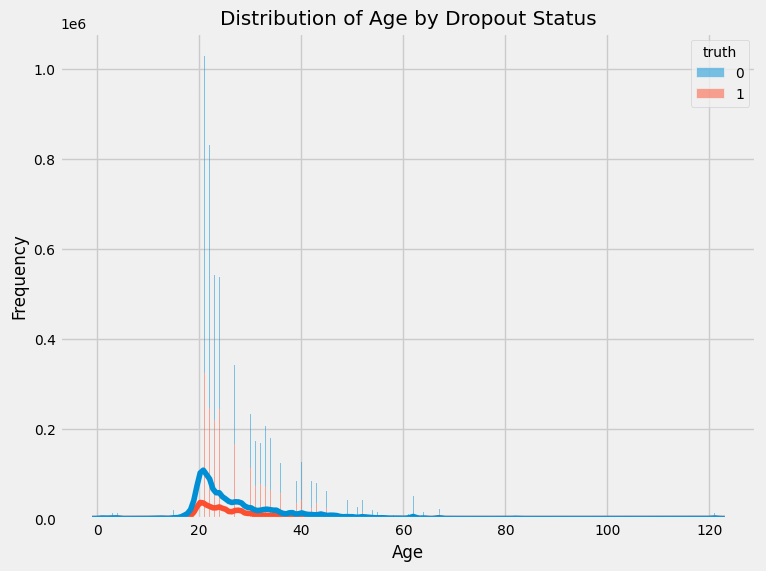

In [ ]:
# Tính toán tuổi của sinh viên
eda_info['age'] = int(max(eda_info['time'])[:4]) - eda_info['birth']

# Vẽ biểu đồ phân phối tuổi của sinh viên theo nhãn 'truth'
plt.figure(figsize=(8, 6))
sns.histplot(data=eda_info, x='age', hue='truth', multiple='stack', kde=True)
plt.title('Distribution of Age by Dropout Status')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Tính tuổi trung bình theo nhóm 'truth'
age_grouped = eda_info.groupby('truth')['age'].mean()
print("Average age by truth status:", age_grouped)

Average age by truth status: truth
0    27.943659
1    27.504832
Name: age, dtype: float64


<Figure size 1000x600 with 0 Axes>

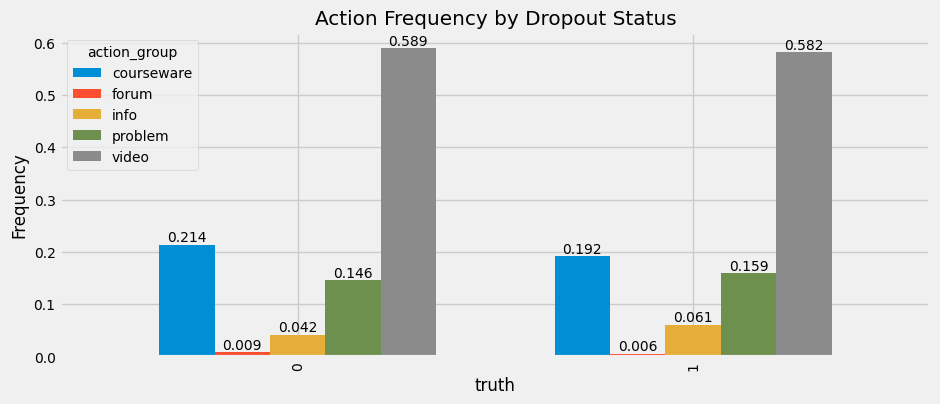

In [ ]:
# Tạo nhóm hành động
action_dict = {
    'video': ['seek_video', 'play_video', 'pause_video', 'stop_video', 'load_video'],
    'problem': ['problem_get', 'problem_check', 'problem_save', 'reset_problem', 'problem_check_correct', 'problem_check_incorrect'],
    'forum': ['create_thread', 'create_comment', 'delete_thread', 'delete_comment', 'click_forum', 'close_forum'],
    'info': ['click_info', 'click_about', 'click_progress'],
    'courseware': ['click_courseware', 'close_courseware']
}

# Đảo ngược dictionary để thay thế nhóm hành động
action_dict_inv = {v: k for k, values in action_dict.items() for v in values}

# Thay thế hành động thành nhóm tương ứng
eda_info['action_group'] = eda_info['action'].replace(action_dict_inv)

# Vẽ biểu đồ tần suất hành động theo nhóm nhãn 'truth'
plt.figure(figsize=(10, 6))
ax = pd.crosstab(eda_info['truth'], eda_info['action_group'], normalize='index').plot(kind='bar', figsize=(10, 4), width=0.7)
plt.title('Action Frequency by Dropout Status')
plt.ylabel('Frequency')
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f')
plt.show()

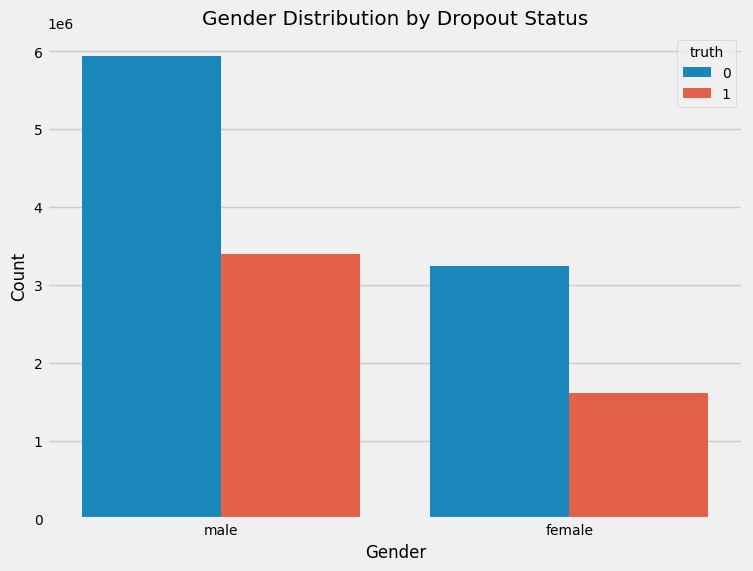

In [ ]:
# Vẽ biểu đồ phân phối giới tính của sinh viên theo nhãn 'truth'
plt.figure(figsize=(8, 6))
sns.countplot(data=eda_info, x='gender', hue='truth')
plt.title('Gender Distribution by Dropout Status')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

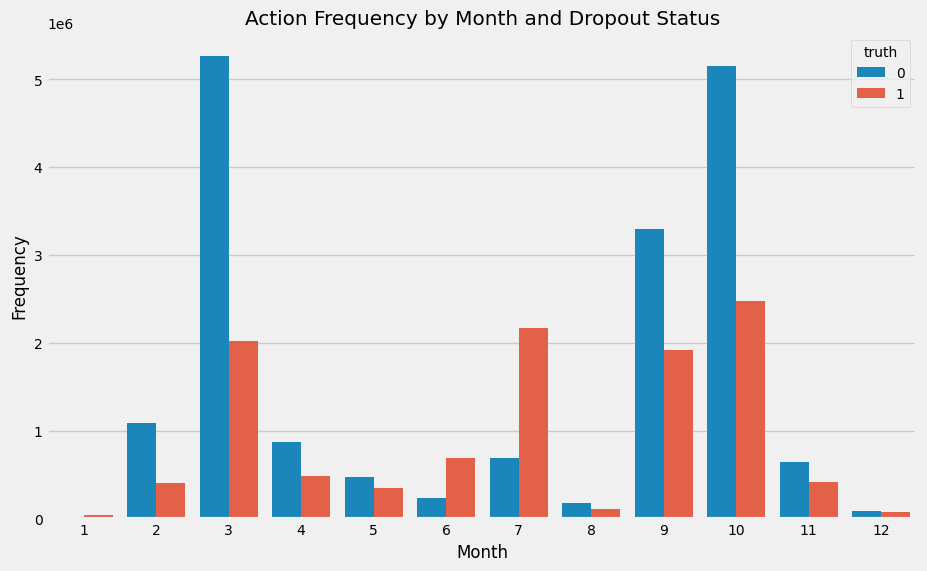

In [ ]:
# Chuyển đổi cột 'time' sang định dạng datetime để phân tích theo thời gian
eda_info['time'] = pd.to_datetime(eda_info['time'])

# Thêm cột 'month' để phân nhóm hành động theo tháng
eda_info['month'] = eda_info['time'].dt.month

# Vẽ biểu đồ phân phối số lượng hành động theo tháng
plt.figure(figsize=(10, 6))
sns.countplot(data=eda_info, x='month', hue='truth')
plt.title('Action Frequency by Month and Dropout Status')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.show()

Biểu đồ thể hiện tần suất hành động theo tháng, giúp thống kê lại tháng nào người dùng tương tác với các đối tượng nhiều nhất

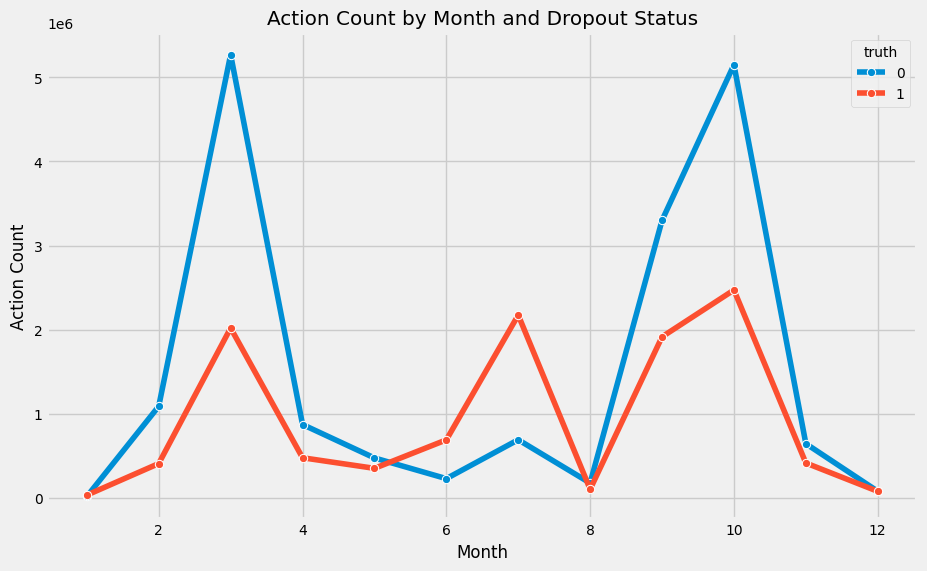

In [ ]:
# Tính tần suất hành động theo tháng và nhóm 'truth'
monthly_actions = eda_info.groupby(['month', 'truth'])['action'].count().reset_index()

# Vẽ biểu đồ so sánh số lượng hành động theo tháng và nhóm 'truth'
plt.figure(figsize=(10, 6))
sns.lineplot(data=monthly_actions, x='month', y='action', hue='truth', marker='o')
plt.title('Action Count by Month and Dropout Status')
plt.xlabel('Month')
plt.ylabel('Action Count')
plt.show()

In [ ]:
Biểu đồ thể hiện tần suất bỏ học theo hành động thông qua các tháng, dựa trên biểu đồ ta thấy đường màu đỏ là mức độ học sinh bỏ học khá nhiều, đạt đỉnh vào những tháng 10, tháng 7. Thường trong các thời gian gần thi cử

#### Courses

In [ ]:
# Loại bỏ giá trị null trong course_info
course_info.dropna()

,id,course_id,start,end,course_type,category
17,577,TsinghuaX/70150023X/2015_T1,2015-03-02 08:00:00,2015-07-05 00:00:00,0,engineering
38,5735,course-v1:NJU+010101+2016_T1,2016-03-28 08:00:00,2017-02-15 23:30:00,0,social science
41,11612,course-v1:DYU+dyuglbbx+2017_T2,2017-09-05 08:00:00,2017-12-25 23:30:00,0,economics
45,9290,course-v1:TsinghuaX+00690302_2+2017_T2,2017-04-03 08:00:00,2017-05-31 23:30:00,0,literature
59,2070,course-v1:TsinghuaX+00510663X+2015_T2,2015-10-12 12:00:00,2016-01-16 00:00:00,0,business
...,...,...,...,...,...,...
6388,11774,course-v1:NCTU+wym+2017_T2,2017-09-05 08:00:00,2017-12-25 23:30:00,0,philosophy
6390,6771,course-v1:TsinghuaX+30700313X+2016_T2,2016-09-07 08:00:00,2016-12-23 00:00:00,0,social science
6396,1562,course-v1:TsinghuaX+30140393x_2015_2+2015_T2,2015-09-21 01:00:00,2016-02-01 08:00:00,0,physics
6398,715,TsinghuaX/THUSEM007/_,2015-06-19 08:00:00,2015-07-24 16:00:00,0,economics


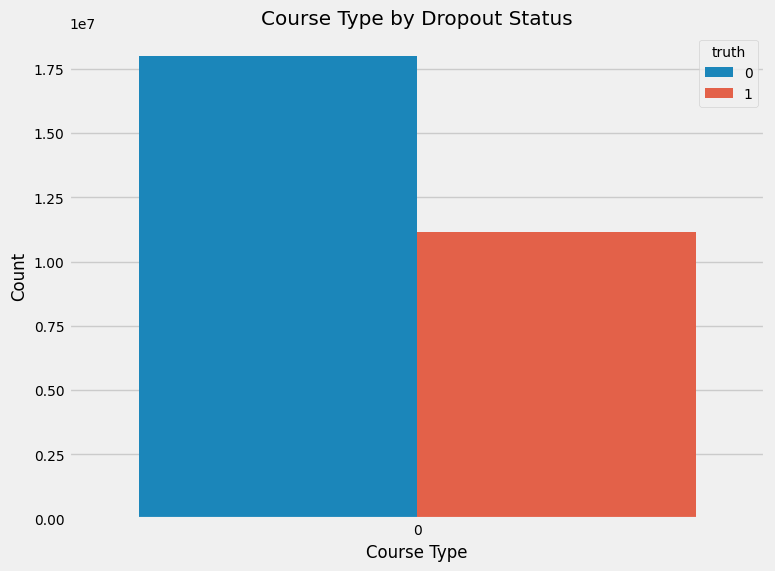

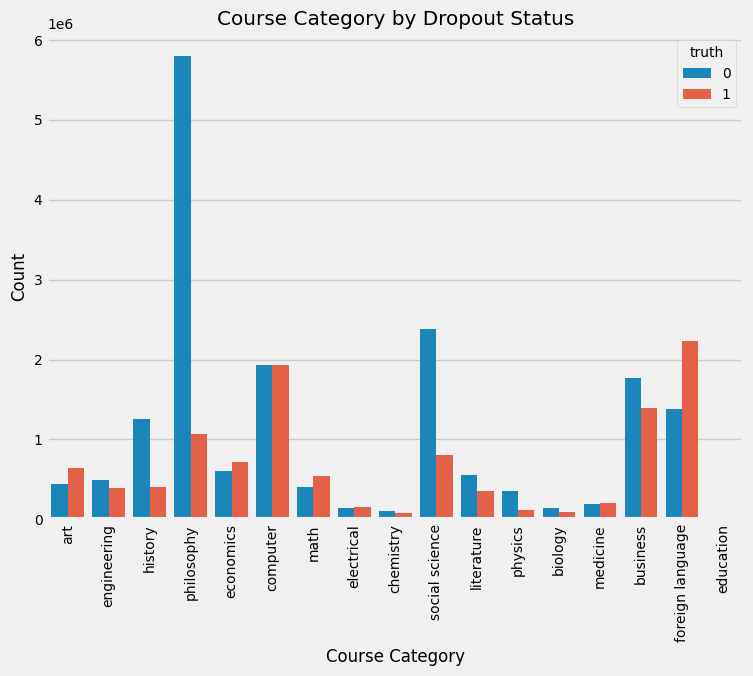

In [ ]:
# Thêm thông tin khóa học vào dữ liệu
eda_info = eda_info.merge(course_info[['course_id', 'course_type', 'category']], on='course_id', how='left')

# Vẽ biểu đồ so sánh loại khóa học (course_type) theo nhãn 'truth'
plt.figure(figsize=(8, 6))
sns.countplot(data=eda_info, x='course_type', hue='truth')
plt.title('Course Type by Dropout Status')
plt.xlabel('Course Type')
plt.ylabel('Count')
plt.show()

# Vẽ biểu đồ phân phối theo 'category' của khóa học
plt.figure(figsize=(8, 6))
sns.countplot(data=eda_info, x='category', hue='truth')
plt.title('Course Category by Dropout Status')
plt.xlabel('Course Category')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

BIểu đồ thể hiện tần suất bỏ học qua môn học, Môn tâm lý có tỷ lệ bỏ học rất cao, bên cạnh đó môn xã hội học cũng khá cao so vói tỷ lệ còn đi học

## Feature Engineering

#### Action Frequency

In [ ]:
# Phân tích các hành động theo enroll_id trong dữ liệu huấn luyện
train_actions = train.groupby('enroll_id')['action'].value_counts().unstack().fillna(0).reset_index()

# Thêm các thống kê mô tả về tần suất hành động
train_actions['action_sum'] = train_actions.sum(axis=1)
train_actions['action_mean'] = train_actions.mean(axis=1)
train_actions['action_std'] = train_actions.std(axis=1)

train_actions.head()

action,enroll_id,click_about,click_courseware,click_forum,click_info,click_progress,close_courseware,close_forum,create_comment,create_thread,...,problem_check_correct,problem_check_incorrect,problem_get,problem_save,reset_problem,seek_video,stop_video,action_sum,action_mean,action_std
0,772,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,774.0,64.500000,213.621160
1,773,2.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,6.0,0.0,794.0,66.166667,216.310669
2,774,0.0,17.0,0.0,6.0,0.0,9.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,9.0,1.0,848.0,70.666667,223.530137
3,776,2.0,4.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,795.0,66.250000,216.882697
4,777,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,781.0,65.083333,215.255065


#### Action Occurences (First & Last)

- Sort DataFrame by 'enroll_id' and 'time'

In [ ]:
# Sắp xếp dữ liệu theo enroll_id và thời gian
train_sorted = train.sort_values(['enroll_id', 'time'])

- Group Data by 'enroll_id', Extract First and Last Actions, and Convert to Dummy Variables

In [ ]:
# Tạo danh sách hành động đầu tiên và cuối cùng theo enroll_id
train_actions_fl = pd.get_dummies(train_sorted.groupby('enroll_id')['action'].agg(first_action='first', last_action='last').reset_index(), drop_first=True)
train_actions_fl.head()

,enroll_id,first_action_click_courseware,first_action_click_forum,first_action_click_info,first_action_click_progress,first_action_close_courseware,first_action_create_comment,first_action_create_thread,first_action_delete_comment,first_action_load_video,...,last_action_pause_video,last_action_play_video,last_action_problem_check,last_action_problem_check_correct,last_action_problem_check_incorrect,last_action_problem_get,last_action_problem_save,last_action_reset_problem,last_action_seek_video,last_action_stop_video
0,772,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,773,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,774,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,776,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,777,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Tạo danh sách hành động đầu tiên và cuối cùng cho mỗi sinh viên
train_sorted = train.sort_values(['enroll_id', 'time'])
train_actions_fl = train_sorted.groupby('enroll_id')['action'].agg(first_action='first', last_action='last').reset_index()

# Tạo đặc trưng phân loại (dummies) cho hành động đầu tiên và cuối cùng
train_actions_fl_dummies = pd.get_dummies(train_actions_fl, drop_first=True)

# Thêm thời gian giữa hành động đầu tiên và cuối cùng
train_sorted['action_time_diff'] = (train_sorted.groupby('enroll_id')['time']
                                    .transform('max') - train_sorted.groupby('enroll_id')['time']
                                    .transform('min')).dt.total_seconds()
train_actions_fl['time_diff'] = train_sorted.groupby('enroll_id')['action_time_diff'].agg('mean')

train_actions_fl.head()

,enroll_id,first_action,last_action,time_diff
0,772,click_about,click_info,NaN
1,773,click_about,close_courseware,NaN
2,774,click_info,click_courseware,NaN
3,776,click_about,close_courseware,NaN
4,777,click_about,close_courseware,NaN


#### Session Length

In [ ]:
# Chuyển đổi cột 'time' sang dạng datetime
train['time'] = pd.to_datetime(train['time'])

In [ ]:
# Tính khoảng thời gian trong từng session theo enroll_id
train_sessions = train.groupby(['enroll_id', 'session_id'])['time'].agg(np.ptp).reset_index()

In [ ]:
# Tính thời gian trung bình và số lượng session theo enroll_id
train_sessions_avg = train_sessions.groupby('enroll_id')['time'].agg(avg_time='mean', sessions='count').reset_index()
train_sessions_avg['avg_secs'] = train_sessions_avg['avg_time'].dt.total_seconds()  # Chuyển thời gian sang giây
# Thêm các đặc trưng liên quan đến session
train_sessions_avg['session_time_per_user'] = train_sessions_avg['avg_secs'] / train_sessions_avg['sessions']
train_sessions_avg.head()

,enroll_id,avg_time,sessions,avg_secs,session_time_per_user
0,772,0 days 00:00:13,1,13.000000,13.000000
1,773,0 days 00:05:56,1,356.000000,356.000000
2,774,0 days 00:26:29.333333333,3,1589.333333,529.777778
3,776,0 days 04:16:54,1,15414.000000,15414.000000
4,777,0 days 00:22:41,1,1361.000000,1361.000000


#### User Attributes

In [ ]:
# Tính tuổi cho user_info_nonai cho user_info_nona
user_info_nona['age'] = 2017 - user_info_nona['birth']

In [ ]:
# Kết hợp enroll_id và username từ dữ liệu huấn luyện và user_info
enroll_dict = train[['enroll_id', 'username']].drop_duplicates(subset=['enroll_id'])
train_users = enroll_dict.merge(user_info_nona, left_on="username", right_on="user_id")
train_users.head()

,enroll_id,username,user_id,gender,education,birth,age
0,772,5981,5981,male,Master's,1989.0,28.0
1,776,561867,561867,female,Associate,1981.0,36.0
2,782,97,97,male,High,1992.0,25.0
3,790,175887,175887,male,Master's,1983.0,34.0
4,793,442687,442687,female,High,1994.0,23.0


#### Course Attributes

In [ ]:
# Kết hợp enroll_id và course_id từ dữ liệu huấn luyện và course_info_nona
course_dict = train[['enroll_id', 'course_id']].drop_duplicates(subset=['enroll_id'])
train_courses = course_dict.merge(course_info_nona[['course_id', 'course_type', 'category']], on='course_id')
train_courses[train_courses['course_type'] == 1]
train_courses.head()

,enroll_id,course_id,course_type,category
0,772,course-v1:TsinghuaX+70800232X+2015_T2,0,art
1,773,course-v1:TsinghuaX+70800232X+2015_T2,0,art
2,774,course-v1:TsinghuaX+70800232X+2015_T2,0,art
3,776,course-v1:TsinghuaX+70800232X+2015_T2,0,art
4,777,course-v1:TsinghuaX+70800232X+2015_T2,0,art


#### Combining Features

In [ ]:
# Kết hợp hành động, session và các thông tin liên quan với enroll_id
train_behavior = train_actions.merge(train_actions_fl.merge(train_sessions_avg[['enroll_id', 'sessions', 'avg_secs']], on='enroll_id'), on='enroll_id')
train_behavior.head()

,enroll_id,click_about,click_courseware,click_forum,click_info,click_progress,close_courseware,close_forum,create_comment,create_thread,...,last_action_problem_check,last_action_problem_check_correct,last_action_problem_check_incorrect,last_action_problem_get,last_action_problem_save,last_action_reset_problem,last_action_seek_video,last_action_stop_video,sessions,avg_secs
0,772,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,13.000000
1,773,2.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,356.000000
2,774,0.0,17.0,0.0,6.0,0.0,9.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,3,1589.333333
3,776,2.0,4.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,15414.000000
4,777,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,1361.000000


In [ ]:
# Xem kích thước dữ liệu train_behavior
train_behavior.shape

(157943, 63)

In [ ]:
# Kết hợp các thông tin về người dùng và khoa học
train_full_nona = train_behavior.merge(pd.get_dummies(train_users[['enroll_id', 'gender', 'education', 'age']], drop_first=True), on='enroll_id')
train_full_nona = train_full_nona.merge(pd.get_dummies(train_courses[['enroll_id', 'category']], drop_first=True), on='enroll_id')

In [ ]:
train_full_nona.head()

,enroll_id,click_about,click_courseware,click_forum,click_info,click_progress,close_courseware,close_forum,create_comment,create_thread,...,category_electrical,category_engineering,category_foreign language,category_history,category_literature,category_math,category_medicine,category_philosophy,category_physics,category_social science
0,772,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
1,776,2.0,4.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
2,782,2.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
3,790,1.0,3.0,0.0,4.0,4.0,2.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
4,793,2.0,12.0,0.0,4.0,0.0,9.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False


### Check dataset

In [ ]:
# train_behavior gồm  157943 dòng dữ liệu
# train_actions gồm 157943 dòng dữ liệu
# train_actions_fl gồm  157943 dòng dữ liệu
# train_courses gồm 157330 dòng dữ liệu
# train_sessions gồm 358922 dòng dữ liệu
# train_sessions_avg gồm 157943 dòng dữ liệu
# train_sorted gồm 29165540 dòng dữ liệu
# train_users gồm 42823 dòng dữ liệu
# train_full_nona gồm 42631 dòng dữ liệu
# hãy ước tính xem thời gian để xây dựng lên mô hình directed network trên source code của bạn


In [ ]:
# Tạo dictionary lưu trữ các dữ liệu với mỗi tên dataset
datasets = {
    "train_behavior": train_behavior.head(),
    "train_actions": train_actions.head(),
    "train_actions_fl": train_actions_fl.head(),
    "train_courses": train_courses.head(),
    "train_sessions": train_sessions.head(),
    "train_sessions_avg": train_sessions_avg.head(),
    "train_sorted": train_sorted.head(),
    "train_users": train_users.head(),
    "train_full_nona": train_full_nona.head(),
}

# Hiển thị và in thông tin các dataset
for name, df in datasets.items():
    print(f"Dataset: {name}")
    display(df)
    display(df.columns)
    display(df.count())
    print('---')

Dataset: train_behavior


,enroll_id,click_about,click_courseware,click_forum,click_info,click_progress,close_courseware,close_forum,create_comment,create_thread,...,last_action_problem_check,last_action_problem_check_correct,last_action_problem_check_incorrect,last_action_problem_get,last_action_problem_save,last_action_reset_problem,last_action_seek_video,last_action_stop_video,sessions,avg_secs
0,772,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,13.000000
1,773,2.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,356.000000
2,774,0.0,17.0,0.0,6.0,0.0,9.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,3,1589.333333
3,776,2.0,4.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,15414.000000
4,777,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,1,1361.000000


Index(['enroll_id', 'click_about', 'click_courseware', 'click_forum',
       'click_info', 'click_progress', 'close_courseware', 'close_forum',
       'create_comment', 'create_thread', 'delete_comment', 'delete_thread',
       'load_video', 'pause_video', 'play_video', 'problem_check',
       'problem_check_correct', 'problem_check_incorrect', 'problem_get',
       'problem_save', 'reset_problem', 'seek_video', 'stop_video',
       'first_action_click_courseware', 'first_action_click_forum',
       'first_action_click_info', 'first_action_click_progress',
       'first_action_close_courseware', 'first_action_create_comment',
       'first_action_create_thread', 'first_action_delete_comment',
       'first_action_load_video', 'first_action_pause_video',
       'first_action_play_video', 'first_action_problem_check',
       'first_action_problem_check_correct',
       'first_action_problem_check_incorrect', 'first_action_problem_get',
       'first_action_problem_save', 'first_action_re

enroll_id                    5
click_about                  5
click_courseware             5
click_forum                  5
click_info                   5
                            ..
last_action_reset_problem    5
last_action_seek_video       5
last_action_stop_video       5
sessions                     5
avg_secs                     5
Length: 63, dtype: int64

---
Dataset: train_actions


action,enroll_id,click_about,click_courseware,click_forum,click_info,click_progress,close_courseware,close_forum,create_comment,create_thread,...,pause_video,play_video,problem_check,problem_check_correct,problem_check_incorrect,problem_get,problem_save,reset_problem,seek_video,stop_video
0,772,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,773,2.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,...,3.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0
2,774,0.0,17.0,0.0,6.0,0.0,9.0,0.0,0.0,0.0,...,10.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,1.0
3,776,2.0,4.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,777,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Index(['enroll_id', 'click_about', 'click_courseware', 'click_forum',
       'click_info', 'click_progress', 'close_courseware', 'close_forum',
       'create_comment', 'create_thread', 'delete_comment', 'delete_thread',
       'load_video', 'pause_video', 'play_video', 'problem_check',
       'problem_check_correct', 'problem_check_incorrect', 'problem_get',
       'problem_save', 'reset_problem', 'seek_video', 'stop_video'],
      dtype='object', name='action')

action
enroll_id                  5
click_about                5
click_courseware           5
click_forum                5
click_info                 5
click_progress             5
close_courseware           5
close_forum                5
create_comment             5
create_thread              5
delete_comment             5
delete_thread              5
load_video                 5
pause_video                5
play_video                 5
problem_check              5
problem_check_correct      5
problem_check_incorrect    5
problem_get                5
problem_save               5
reset_problem              5
seek_video                 5
stop_video                 5
dtype: int64

---
Dataset: train_actions_fl


,enroll_id,first_action_click_courseware,first_action_click_forum,first_action_click_info,first_action_click_progress,first_action_close_courseware,first_action_create_comment,first_action_create_thread,first_action_delete_comment,first_action_load_video,...,last_action_pause_video,last_action_play_video,last_action_problem_check,last_action_problem_check_correct,last_action_problem_check_incorrect,last_action_problem_get,last_action_problem_save,last_action_reset_problem,last_action_seek_video,last_action_stop_video
0,772,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,773,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,774,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,776,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,777,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Index(['enroll_id', 'first_action_click_courseware',
       'first_action_click_forum', 'first_action_click_info',
       'first_action_click_progress', 'first_action_close_courseware',
       'first_action_create_comment', 'first_action_create_thread',
       'first_action_delete_comment', 'first_action_load_video',
       'first_action_pause_video', 'first_action_play_video',
       'first_action_problem_check', 'first_action_problem_check_correct',
       'first_action_problem_check_incorrect', 'first_action_problem_get',
       'first_action_problem_save', 'first_action_reset_problem',
       'first_action_seek_video', 'first_action_stop_video',
       'last_action_click_courseware', 'last_action_click_forum',
       'last_action_click_info', 'last_action_click_progress',
       'last_action_close_courseware', 'last_action_create_comment',
       'last_action_create_thread', 'last_action_delete_comment',
       'last_action_load_video', 'last_action_pause_video',
       'last_actio

enroll_id                               5
first_action_click_courseware           5
first_action_click_forum                5
first_action_click_info                 5
first_action_click_progress             5
first_action_close_courseware           5
first_action_create_comment             5
first_action_create_thread              5
first_action_delete_comment             5
first_action_load_video                 5
first_action_pause_video                5
first_action_play_video                 5
first_action_problem_check              5
first_action_problem_check_correct      5
first_action_problem_check_incorrect    5
first_action_problem_get                5
first_action_problem_save               5
first_action_reset_problem              5
first_action_seek_video                 5
first_action_stop_video                 5
last_action_click_courseware            5
last_action_click_forum                 5
last_action_click_info                  5
last_action_click_progress        

---
Dataset: train_courses


,enroll_id,course_id,course_type,category
0,772,course-v1:TsinghuaX+70800232X+2015_T2,0,art
1,773,course-v1:TsinghuaX+70800232X+2015_T2,0,art
2,774,course-v1:TsinghuaX+70800232X+2015_T2,0,art
3,776,course-v1:TsinghuaX+70800232X+2015_T2,0,art
4,777,course-v1:TsinghuaX+70800232X+2015_T2,0,art


Index(['enroll_id', 'course_id', 'course_type', 'category'], dtype='object')

enroll_id      5
course_id      5
course_type    5
category       5
dtype: int64

---
Dataset: train_sessions


,enroll_id,session_id,time
0,772,d8a9b787fa69063c34c73b9c29190b1c,0 days 00:00:13
1,773,2f02b86eb3ea2cbf0be11385a8dc62e5,0 days 00:05:56
2,774,138155092c1a9ce258b0da27a169b14d,0 days 00:00:08
3,774,26449d5b9c0dfd76bdf981410ef33d94,0 days 00:58:53
4,774,fd2ad174b4aa8f6dd3e8900e1ba62735,0 days 00:20:27


Index(['enroll_id', 'session_id', 'time'], dtype='object')

enroll_id     5
session_id    5
time          5
dtype: int64

---
Dataset: train_sessions_avg


,enroll_id,avg_time,sessions,avg_secs
0,772,0 days 00:00:13,1,13.000000
1,773,0 days 00:05:56,1,356.000000
2,774,0 days 00:26:29.333333333,3,1589.333333
3,776,0 days 04:16:54,1,15414.000000
4,777,0 days 00:22:41,1,1361.000000


Index(['enroll_id', 'avg_time', 'sessions', 'avg_secs'], dtype='object')

enroll_id    5
avg_time     5
sessions     5
avg_secs     5
dtype: int64

---
Dataset: train_sorted


,enroll_id,username,course_id,session_id,action,object,time
0,772,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_about,NaN,2015-09-27T15:42:59
1,772,5981,course-v1:TsinghuaX+70800232X+2015_T2,d8a9b787fa69063c34c73b9c29190b1c,click_info,NaN,2015-09-27T15:43:12
22,773,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,click_about,NaN,2015-10-19T19:33:17
20,773,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,click_about,NaN,2015-10-19T19:33:21
21,773,1544995,course-v1:TsinghuaX+70800232X+2015_T2,2f02b86eb3ea2cbf0be11385a8dc62e5,click_info,NaN,2015-10-19T19:33:22


Index(['enroll_id', 'username', 'course_id', 'session_id', 'action', 'object',
       'time'],
      dtype='object')

enroll_id     5
username      5
course_id     5
session_id    5
action        5
object        0
time          5
dtype: int64

---
Dataset: train_users


,enroll_id,username,user_id,gender,education,birth,age
0,772,5981,5981,male,Master's,1989.0,28.0
1,776,561867,561867,female,Associate,1981.0,36.0
2,782,97,97,male,High,1992.0,25.0
3,790,175887,175887,male,Master's,1983.0,34.0
4,793,442687,442687,female,High,1994.0,23.0


Index(['enroll_id', 'username', 'user_id', 'gender', 'education', 'birth',
       'age'],
      dtype='object')

enroll_id    5
username     5
user_id      5
gender       5
education    5
birth        5
age          5
dtype: int64

---
Dataset: train_full_nona


,enroll_id,click_about,click_courseware,click_forum,click_info,click_progress,close_courseware,close_forum,create_comment,create_thread,...,category_electrical,category_engineering,category_foreign language,category_history,category_literature,category_math,category_medicine,category_philosophy,category_physics,category_social science
0,772,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
1,776,2.0,4.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
2,782,2.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
3,790,1.0,3.0,0.0,4.0,4.0,2.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
4,793,2.0,12.0,0.0,4.0,0.0,9.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False


Index(['enroll_id', 'click_about', 'click_courseware', 'click_forum',
       'click_info', 'click_progress', 'close_courseware', 'close_forum',
       'create_comment', 'create_thread', 'delete_comment', 'delete_thread',
       'load_video', 'pause_video', 'play_video', 'problem_check',
       'problem_check_correct', 'problem_check_incorrect', 'problem_get',
       'problem_save', 'reset_problem', 'seek_video', 'stop_video',
       'first_action_click_courseware', 'first_action_click_forum',
       'first_action_click_info', 'first_action_click_progress',
       'first_action_close_courseware', 'first_action_create_comment',
       'first_action_create_thread', 'first_action_delete_comment',
       'first_action_load_video', 'first_action_pause_video',
       'first_action_play_video', 'first_action_problem_check',
       'first_action_problem_check_correct',
       'first_action_problem_check_incorrect', 'first_action_problem_get',
       'first_action_problem_save', 'first_action_re

enroll_id                  5
click_about                5
click_courseware           5
click_forum                5
click_info                 5
                          ..
category_math              5
category_medicine          5
category_philosophy        5
category_physics           5
category_social science    5
Length: 87, dtype: int64

---


# DIRECTED NETWORK

### Draw Directed Network for each user_ID

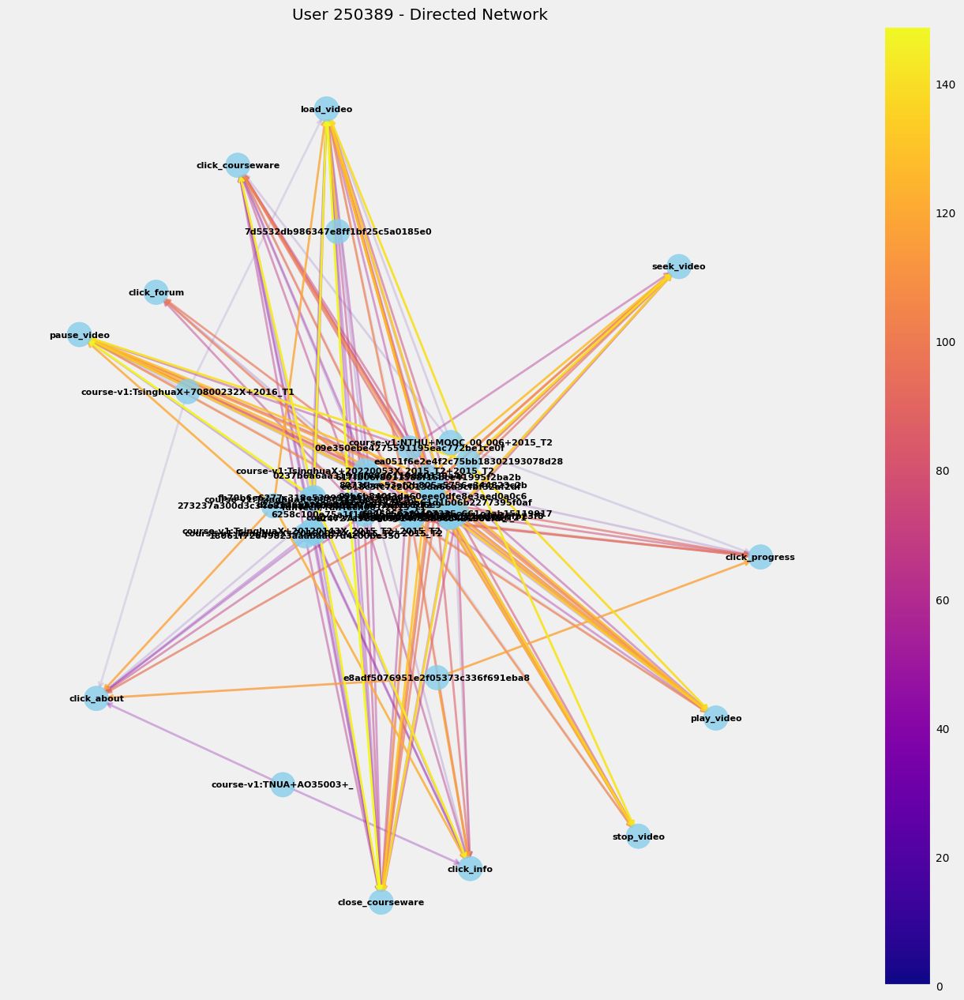

In [ ]:
# Hàm vẽ mạng lưới người dùng (dựa trên ID người dùng)
def draw_user_network(user_id):
    # Lọc dữ liệu của người dùng theo ID
    user_data = train_users[train_users['user_id'] == user_id]

    # Nếu không có dữ liệu, báo lỗi và thoát
    if user_data.empty:
        print(f"No data found for user_id: {user_id}")
        return

    # Lấy thông tin khóa học, phiên và hành động liên quan đến người dùng
    user_courses = train_courses[train_courses['enroll_id'].isin(user_data['enroll_id'])]
    user_sessions = train_sessions[train_sessions['enroll_id'].isin(user_data['enroll_id'])]
    user_actions = train_sorted[train_sorted['enroll_id'].isin(user_data['enroll_id'])]

    # Tạo đồ thị có hướng
    G = nx.DiGraph()

    # Thêm các nút (node) loại "khóa học"
    for course_id in user_courses['course_id']:
        G.add_node(course_id, type='course')

    # Thêm các nút loại "phiên"
    for session_id in user_sessions['session_id']:
        G.add_node(session_id, type='session')

    # Thêm các nút loại "hành động"
    for action in user_actions['action']:
        G.add_node(action, type='action')

    # Thêm các cạnh (edge) vào đồ thị
    for _, row in user_actions.iterrows():
        G.add_edge(row['course_id'], row['action'])  # Khóa học -> Hành động
        G.add_edge(row['session_id'], row['action'])  # Phiên -> Hành động

    # Thiết lập bố cục đồ thị
    pos = nx.spring_layout(G, seed=42)

    # Cài đặt kích thước và màu sắc cho các nút
    node_sizes = [500 for _ in G.nodes()]
    node_colors = ['skyblue' for _ in G.nodes()]

    # Cài đặt màu sắc và độ trong suốt cho các cạnh
    edge_colors = range(len(G.edges()))
    M = len(G.edges())
    edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
    cmap = plt.cm.plasma

    # Vẽ đồ thị
    plt.figure(figsize=(15, 15))
    nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.8)
    edges = nx.draw_networkx_edges(
        G,
        pos,
        arrowstyle="->",
        arrowsize=10,
        edge_color=edge_colors,
        edge_cmap=cmap,
        width=2,
    )

    # Áp dụng độ trong suốt cho các cạnh
    for i in range(M):
        edges[i].set_alpha(edge_alphas[i])

    # Hiển thị nhãn nút
    labels = nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

    # Tắt trục
    ax = plt.gca()
    ax.set_axis_off()

    # Hiển thị thanh màu (colorbar)
    pc = mpl.collections.PatchCollection(edges, cmap=cmap)
    pc.set_array(edge_colors)
    plt.colorbar(pc, ax=ax)

    # Thêm tiêu đề
    plt.title(f"User {user_id} - Directed Network")
    plt.show()

# Ví dụ với một user_id
user_id = 250389  # Nhập user_id cần trực quan hóa
draw_user_network(user_id)

### Draw Directed Network for each User_ID (anothoer graph)

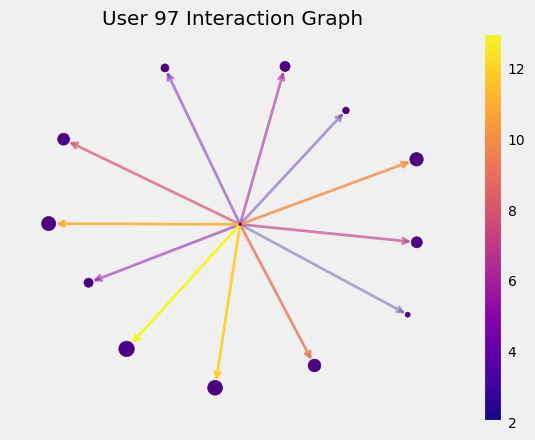

Nodes: [97, 'course-v1:TsinghuaX+70800232X+2015_T2', 'course-v1:TsinghuaX+10610224X+2015_T3', 'TsinghuaX/20740042X/2015_T2', 'TsinghuaX/60510102X/_', 'course-v1:UST+UST001+_', 'course-v1:TsinghuaX+00690212X+2015_T2', 'course-v1:TsinghuaX+80512073X_2015_2+2015_T2', 'course-v1:NTHU+MOOC_00_005+2015_T2', 'course-v1:TsinghuaX+00612642X_2015_2+2015_T2', 'course-v1:TsinghuaX+00510888X_2015_T2+2015_T2', 'TsinghuaX/AP000000X/2015_T2', 'course-v1:TsinghuaX+00740043X_2015_T2+2015_T2']
Edges: [(97, 'course-v1:TsinghuaX+70800232X+2015_T2'), (97, 'course-v1:TsinghuaX+10610224X+2015_T3'), (97, 'TsinghuaX/20740042X/2015_T2'), (97, 'TsinghuaX/60510102X/_'), (97, 'course-v1:UST+UST001+_'), (97, 'course-v1:TsinghuaX+00690212X+2015_T2'), (97, 'course-v1:TsinghuaX+80512073X_2015_2+2015_T2'), (97, 'course-v1:NTHU+MOOC_00_005+2015_T2'), (97, 'course-v1:TsinghuaX+00612642X_2015_2+2015_T2'), (97, 'course-v1:TsinghuaX+00510888X_2015_T2+2015_T2'), (97, 'TsinghuaX/AP000000X/2015_T2'), (97, 'course-v1:TsinghuaX+0

In [ ]:
# Hàm tạo đồ thị con của người dùng
def create_user_subgraph(user_id):
    G = nx.DiGraph()

    # Lấy dữ liệu sắp xếp theo người dùng
    user_sorted_data = train_sorted[train_sorted['username'] == user_id]
    for _, row in user_sorted_data.iterrows():
        course_node = row['course_id']
        G.add_edge(user_id, course_node, relationship='click_course')

    # Dữ liệu phiên liên quan đến người dùng
    user_sessions_data = train_sessions[train_sessions['enroll_id'] == user_id]
    for _, row in user_sessions_data.iterrows():
        session_node = row['session_id']
        G.add_edge(user_id, session_node, relationship='participates_in')

    # Thêm các cạnh giữa phiên và khóa học
    for _, row in user_sessions_data.iterrows():
        session_node = row['session_id']
        course_node = row['course_id']
        G.add_edge(session_node, course_node, relationship='belongs_to')

    # Dữ liệu hành vi người dùng
    user_behavior_data = train_behavior[train_behavior['enroll_id'] == user_id]
    for _, row in user_behavior_data.iterrows():
        for action in ['click_about', 'click_courseware', 'click_forum', 'create_comment', 'load_video', 'play_video']:
            if row[action] > 0:
                G.add_edge(user_id, action, relationship='performed_action')

    # Hành động đầu tiên và liên tiếp
    user_actions_fl_data = train_actions_fl[train_actions_fl['enroll_id'] == user_id]
    for _, row in user_actions_fl_data.iterrows():
        actions = ['first_action_click_courseware', 'first_action_create_comment', 'first_action_play_video']
        for i in range(len(actions) - 1):
            if row[actions[i]] > 0 and row[actions[i+1]] > 0:
                G.add_edge(actions[i], actions[i+1], relationship='sequential_action')

    return G

# Hàm vẽ đồ thị tương tác của người dùng
def draw_user_graph(user_id):
    G_user = create_user_subgraph(user_id)

    # Thiết lập bố cục và thông số
    seed = 13648
    pos = nx.spring_layout(G_user, seed=seed)
    node_sizes = [3 + 10 * i for i in range(len(G_user))]
    M = G_user.number_of_edges()
    edge_colors = range(2, M + 2)
    edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
    cmap = plt.cm.plasma

    # Vẽ nút và cạnh
    nodes = nx.draw_networkx_nodes(G_user, pos, node_size=node_sizes, node_color="indigo")
    edges = nx.draw_networkx_edges(
        G_user,
        pos,
        node_size=node_sizes,
        arrowstyle="->",
        arrowsize=10,
        edge_color=edge_colors,
        edge_cmap=cmap,
        width=2,
    )

    for i in range(M):
        edges[i].set_alpha(edge_alphas[i])

    pc = mpl.collections.PatchCollection(edges, cmap=cmap)
    pc.set_array(edge_colors)

    ax = plt.gca()
    ax.set_axis_off()
    plt.colorbar(pc, ax=ax)
    plt.title(f"User {user_id} Interaction Graph")
    plt.show()

    # Hiển thị thông tin nút và cạnh
    print("Nodes:", list(G_user.nodes))
    print("Edges:", list(G_user.edges))
    print(train_sorted[train_sorted['username'] == user_id])

# Thử nghiệm vẽ đồ thị với một user_id cụ thể
user_id_input = 97
try:
    draw_user_graph(user_id_input)
except Exception as e:
    print("An error occurred:", e)

In [ ]:
def draw_user_network(user_id):
    # lọc data dựa trên user_id
    user_data = train_users[train_users['user_id'] == user_id]

    if user_data.empty:
        print(f"No data found for user_id: {user_id}")
        return

    # lấy các lớp học, hành động và session của user đó
    user_courses = train_courses[train_courses['enroll_id'].isin(user_data['enroll_id'])]
    user_sessions = train_sessions[train_sessions['enroll_id'].isin(user_data['enroll_id'])]
    user_actions = train_sorted[train_sorted['enroll_id'].isin(user_data['enroll_id'])]

    # tạo đồ thị mạng
    G = nx.DiGraph()

    # thêm các đỉnh và cạnh cho mạng
    for course_id in user_courses['course_id']:
        G.add_node(course_id, type='course')

    for session_id in user_sessions['session_id']:
        G.add_node(session_id, type='session')

    for action in user_actions['action']:
        G.add_node(action, type='action')

    # thể hiện mối liên hệ gữa các nút
    for _, row in user_actions.iterrows():
        G.add_edge(row['course_id'], row['action'])  # Course -> Action
        G.add_edge(row['session_id'], row['action'])  # Session -> Action


#trực quan màu sắc
    # Set the graph layout
    pos = nx.spring_layout(G, seed=42)

    # Define node types and corresponding colors
    node_types = nx.get_node_attributes(G, 'type')
    color_map = {
        'course': '#b0d4eb',    # Light blue for courses
        'session': '#e97967',   # Light red for sessions
        'action': '#84f08c',    # Light green for actions
        'unknown': '#323232'    # Dark gray for unknown types
    }
    node_colors = [color_map[node_types.get(node, 'unknown')] for node in G.nodes]

    # Set up edge styles
    edge_colors = range(len(G.edges()))
    M = len(G.edges())
    edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
    cmap = plt.cm.plasma

    # Draw the graph with custom styling
    plt.figure(figsize=(15, 15))
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, alpha=0.9)
    edges = nx.draw_networkx_edges(
        G,
        pos,
        arrowstyle="->",
        arrowsize=10,
        edge_color=edge_colors,
        edge_cmap=cmap,
        width=2,
    )

    # Set transparency for edges
    for i in range(M):
        edges[i].set_alpha(edge_alphas[i])

    # Hide axes
    ax = plt.gca()
    ax.set_axis_off()

    # Add a colorbar for the edges
    pc = mpl.collections.PatchCollection(edges, cmap=cmap)
    pc.set_array(edge_colors)
    plt.colorbar(pc, ax=ax)

    # thêm nhãn cho mạng
    legend_elements = [
        mpl.lines.Line2D([0], [0], marker='o', color='w', label='Course', markersize=15, markerfacecolor='#b0d4eb'),
        mpl.lines.Line2D([0], [0], marker='o', color='w', label='Session', markersize=15, markerfacecolor='#e97967'),
        mpl.lines.Line2D([0], [0], marker='o', color='w', label='Action', markersize=15, markerfacecolor='#84f08c')
    ]
    plt.legend(handles=legend_elements, loc='upper left', title="Node Types", fontsize=15)

    # Display the graph
    plt.title(f"User {user_id} Interaction Network")
    plt.show()

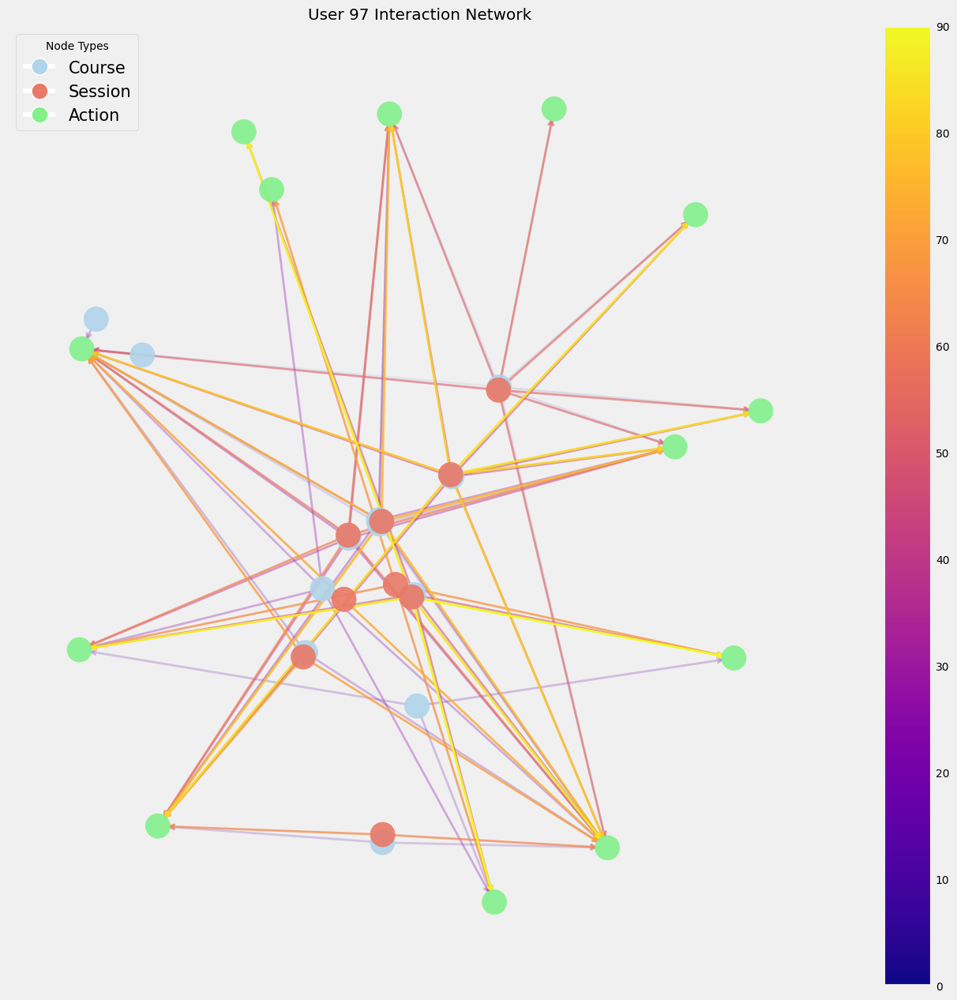

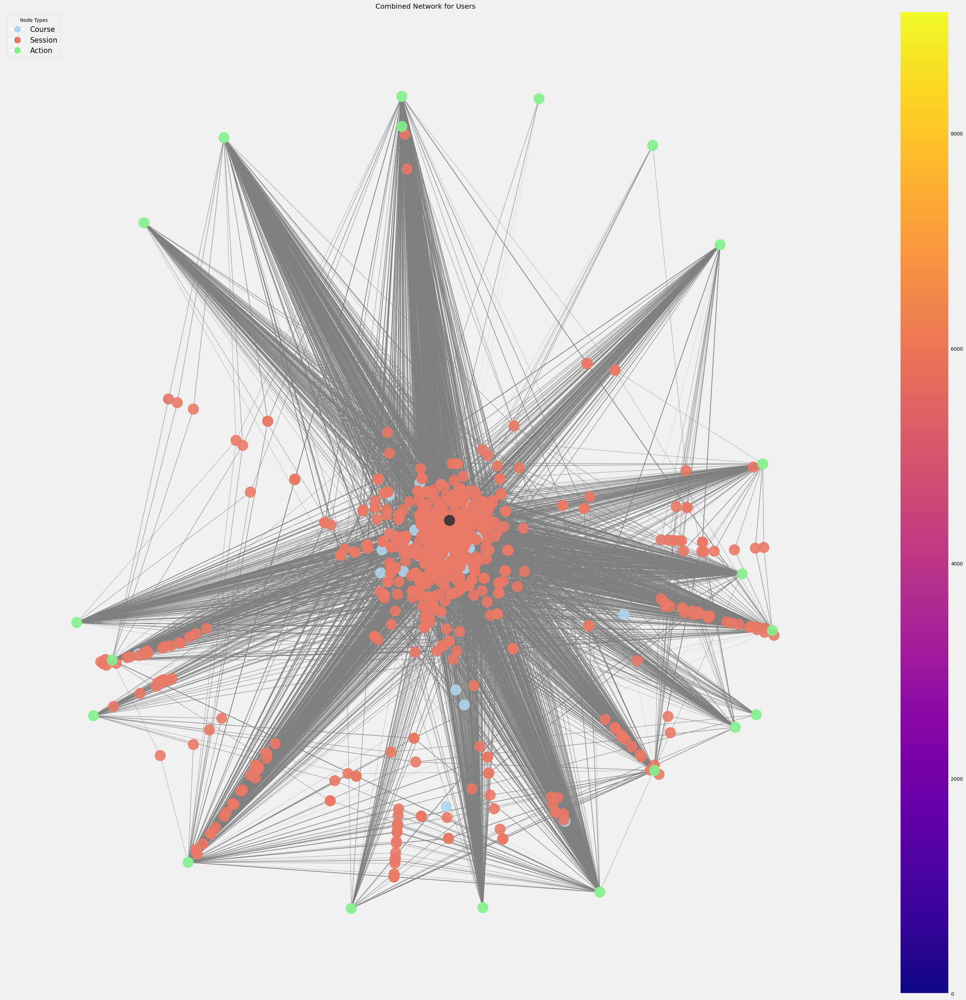

In [ ]:
# Test the user network visualization with a specific user_id
user_id_input = 97
try:
    draw_user_network(user_id_input)
except Exception as e:
    print(f"An error occurred: {e}")

# Function to draw combined network for multiple users
def draw_combined_network_with_colors(user_ids):
    # Filter user data based on the provided user_ids
    user_data = train_users[train_users['user_id'].isin(user_ids)]

    if user_data.empty:
        print("No data found for the provided user_ids.")
        return

    # Combine data for the users
    user_courses = train_courses[train_courses['enroll_id'].isin(user_data['enroll_id'])]
    user_sessions = train_sessions[train_sessions['enroll_id'].isin(user_data['enroll_id'])]
    user_actions = train_sorted[train_sorted['enroll_id'].isin(user_data['enroll_id'])]

    # Create a directed graph for the combined network
    G = nx.DiGraph()

    # Add nodes for courses, sessions, and actions
    for _, row in user_courses.iterrows():
        G.add_node(row['course_id'], type='course')

    for _, row in user_sessions.iterrows():
        G.add_node(row['session_id'], type='session')

    for _, row in user_actions.iterrows():
        G.add_node(row['action'], type='action')

    # Add edges based on relationships
    for _, row in user_actions.iterrows():
        G.add_edge(row['course_id'], row['action'])  # Course -> Action
        G.add_edge(row['session_id'], row['action'])  # Session -> Action

    # Set up layout
    pos = nx.spring_layout(G, seed=42)

    # Define node types and corresponding colors
    node_types = nx.get_node_attributes(G, 'type')
    color_map = {
        'course': '#b0d4eb',
        'session': '#e97967',
        'action': '#84f08c',
        'unknown': '#323232'
    }
    node_colors = [color_map[node_types.get(node, 'unknown')] for node in G.nodes]

    # Edge styles
    edge_colors = range(len(G.edges()))
    M = len(G.edges())
    edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
    cmap = plt.cm.plasma

    # Draw the combined network
    plt.figure(figsize=(35, 35))
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color=node_colors, alpha=0.9)
    edges = nx.draw_networkx_edges(
        G,
        pos,
        arrowstyle="->",
        arrowsize=1,
        edge_color='#7e7f7e',
        edge_cmap=cmap,
        width=1,
    )

    # Set transparency for edges
    for i in range(M):
        edges[i].set_alpha(edge_alphas[i])

    # Hide axes
    ax = plt.gca()
    ax.set_axis_off()

    # Add colorbar and legend
    pc = mpl.collections.PatchCollection(edges, cmap=cmap)
    pc.set_array(edge_colors)
    plt.colorbar(pc, ax=ax)

    legend_elements = [
        mpl.lines.Line2D([0], [0], marker='o', color='w', label='Course', markersize=15, markerfacecolor='#b0d4eb'),
        mpl.lines.Line2D([0], [0], marker='o', color='w', label='Session', markersize=15, markerfacecolor='#e97967'),
        mpl.lines.Line2D([0], [0], marker='o', color='w', label='Action', markersize=15, markerfacecolor='#84f08c')
    ]
    plt.legend(handles=legend_elements, loc='upper left', title="Node Types", fontsize=15)

    plt.title("Combined Network for Users")
    plt.show()

# Example usage with the first 100 users
first_100_users = train_users['user_id'].unique()[:100]
draw_combined_network_with_colors(first_100_users)

##Draw Directed Network for first 50 rows in train_users dataset

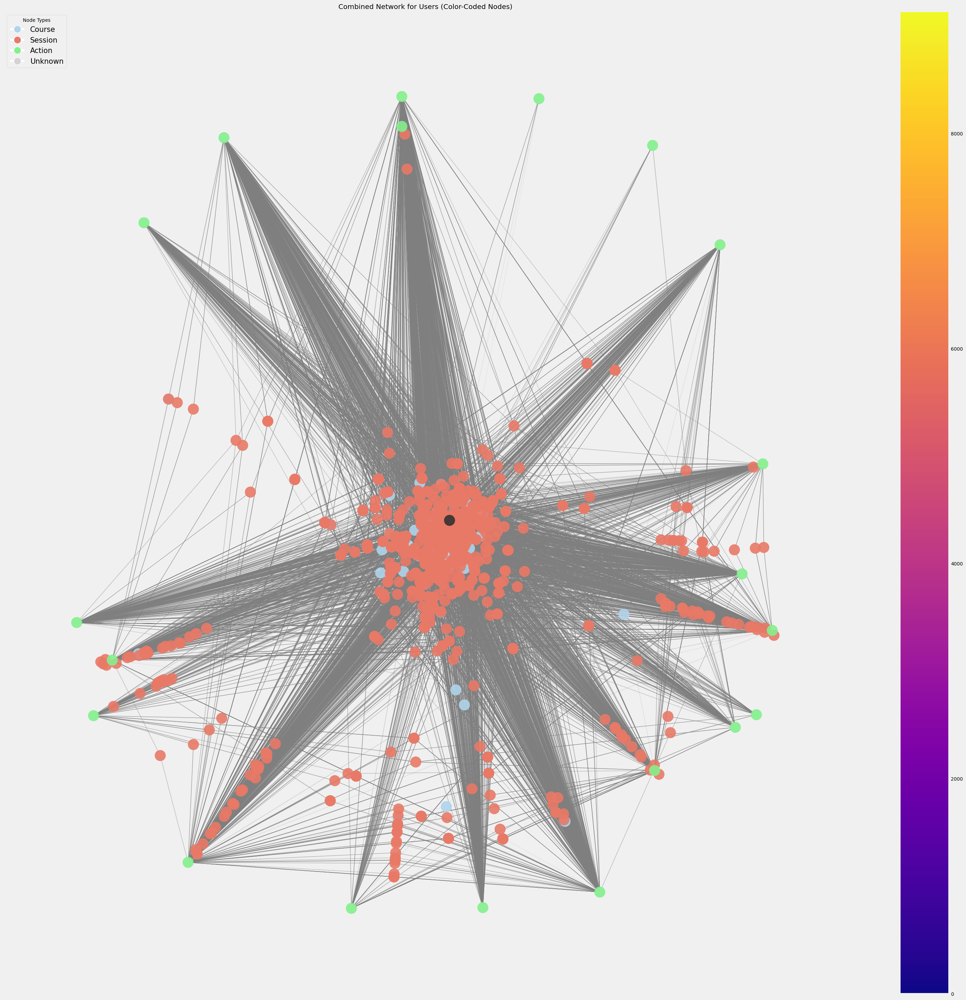

In [ ]:
def draw_combined_network_with_colors(user_ids):
    # Filter data for the specific users
    user_data = train_users[train_users['user_id'].isin(user_ids)]

    if user_data.empty:
        print("No data found for the provided user_ids.")
        return

    # Combine data for the users
    user_courses = train_courses[train_courses['enroll_id'].isin(user_data['enroll_id'])]
    user_sessions = train_sessions[train_sessions['enroll_id'].isin(user_data['enroll_id'])]
    user_actions = train_sorted[train_sorted['enroll_id'].isin(user_data['enroll_id'])]

    # Create a directed graph
    G = nx.DiGraph()

    # Add nodes with a 'type' attribute
    for _, row in user_courses.iterrows():
        G.add_node(row['course_id'], type='course')

    for _, row in user_sessions.iterrows():
        G.add_node(row['session_id'], type='session')

    for _, row in user_actions.iterrows():
        G.add_node(row['action'], type='action')

    # Add edges based on relationships
    for _, row in user_actions.iterrows():
        G.add_edge(row['course_id'], row['action'])  # Course -> Action
        G.add_edge(row['session_id'], row['action'])  # Session -> Action

    # Set up layout
    pos = nx.spring_layout(G, seed=42)

    # Ensure all nodes have a valid type
    node_types = nx.get_node_attributes(G, 'type')
    default_type = 'unknown'
    for node in G.nodes:
        if node not in node_types:
            node_types[node] = default_type

  # Define node types and corresponding colors
    color_map = {
        'course': '#b0d4eb',    # Corrected from 'lightred'
        'session': '#e97967',
        'action': '#84f08c',
        'unknown': '#323232'
    }
    node_colors = [color_map[node_types[node]] for node in G.nodes]

    # Edge colors and styles
    edge_colors = range(len(G.edges()))
    M = len(G.edges())  # Number of edges
    edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
    cmap = plt.cm.plasma

    # Drawing the network
    plt.figure(figsize=(35, 35))
    nx.draw_networkx_nodes(
        G, pos, node_size=500, node_color=node_colors, alpha=0.9
    )
    edges = nx.draw_networkx_edges(
        G,
        pos,
        arrowstyle="->",
        arrowsize=1,
        edge_color='#7e7f7e',
        edge_cmap=cmap,
        width=1,
    )

    # Set alpha value for each edge
    for i in range(M):
        edges[i].set_alpha(edge_alphas[i])

    # Hide axes
    ax = plt.gca()
    ax.set_axis_off()

    # Add a legend for node types
    legend_elements = [
        mpl.lines.Line2D(
            [0], [0], marker='o', color='w', label='Course', markersize=15, markerfacecolor='#b0d4eb'
        ),
        mpl.lines.Line2D(
            [0], [0], marker='o', color='w', label='Session', markersize=15, markerfacecolor='#e97967'
        ),
        mpl.lines.Line2D(
            [0], [0], marker='o', color='w', label='Action', markersize=15, markerfacecolor='#84f08c'
        ),
        mpl.lines.Line2D(
            [0], [0], marker='o', color='w', label='Unknown', markersize=15, markerfacecolor='lightgray'
        )
    ]
    plt.legend(
        handles=legend_elements, loc='upper left', title="Node Types", fontsize=15
    )

    # Add colorbar for edge colors
    pc = mpl.collections.PatchCollection(edges, cmap=cmap)
    pc.set_array(edge_colors)  # Corrected to pass edge_colors as the required argument
    plt.colorbar(pc, ax=ax)

    plt.title("Combined Network for Users (Color-Coded Nodes)")
    plt.show()

# Example usage for the first 50 users
first_50_users = train_users['user_id'].unique()[:100]
draw_combined_network_with_colors(first_50_users)

------------------------------

# TRAIN MODEL BASED ON RESULT OF DIRECTED NETWORK

The session variable's frequent appearance in the directed network graph suggests it plays a central role in student interactions within the dataset. To determine whether it significantly affects a student's likelihood of dropping out, you should conduct a detailed analysis.

In [ ]:
# Hiển thị 5 dòng đầu tiên của bảng train_y (chính là bảng train_truth)
train_y.head()

,enroll_id,truth
0,772,1
1,773,1
2,774,1
3,776,0
4,777,1


In [ ]:
# Hiển thị 5 dòng đầu tiên của bảng train_sessions_avg (trung bình số giây truy cập)
train_sessions_avg.head()

,enroll_id,avg_time,sessions,avg_secs
0,772,0 days 00:00:13,1,13.000000
1,773,0 days 00:05:56,1,356.000000
2,774,0 days 00:26:29.333333333,3,1589.333333
3,776,0 days 04:16:54,1,15414.000000
4,777,0 days 00:22:41,1,1361.000000


In [ ]:
# Hiển thị 5 dòng đầu tiên của bảng train_sessions
train_sessions.head()

,enroll_id,session_id,time
0,772,d8a9b787fa69063c34c73b9c29190b1c,0 days 00:00:13
1,773,2f02b86eb3ea2cbf0be11385a8dc62e5,0 days 00:05:56
2,774,138155092c1a9ce258b0da27a169b14d,0 days 00:00:08
3,774,26449d5b9c0dfd76bdf981410ef33d94,0 days 00:58:53
4,774,fd2ad174b4aa8f6dd3e8900e1ba62735,0 days 00:20:27


In [ ]:
# Merge dữ liệu từ các bảng trung bình, sessions và truth
merged = train_sessions_avg.merge(train_sessions, on='enroll_id', how='inner')
merged = merged.merge(train_y, on='enroll_id', how='inner')
merged.head()

,enroll_id,avg_time,sessions,avg_secs,session_id,time,truth
0,772,0 days 00:00:13,1,13.000000,d8a9b787fa69063c34c73b9c29190b1c,0 days 00:00:13,1
1,773,0 days 00:05:56,1,356.000000,2f02b86eb3ea2cbf0be11385a8dc62e5,0 days 00:05:56,1
2,774,0 days 00:26:29.333333333,3,1589.333333,138155092c1a9ce258b0da27a169b14d,0 days 00:00:08,1
3,774,0 days 00:26:29.333333333,3,1589.333333,26449d5b9c0dfd76bdf981410ef33d94,0 days 00:58:53,1
4,774,0 days 00:26:29.333333333,3,1589.333333,fd2ad174b4aa8f6dd3e8900e1ba62735,0 days 00:20:27,1


## Some graph showing related to Session and Dropout student

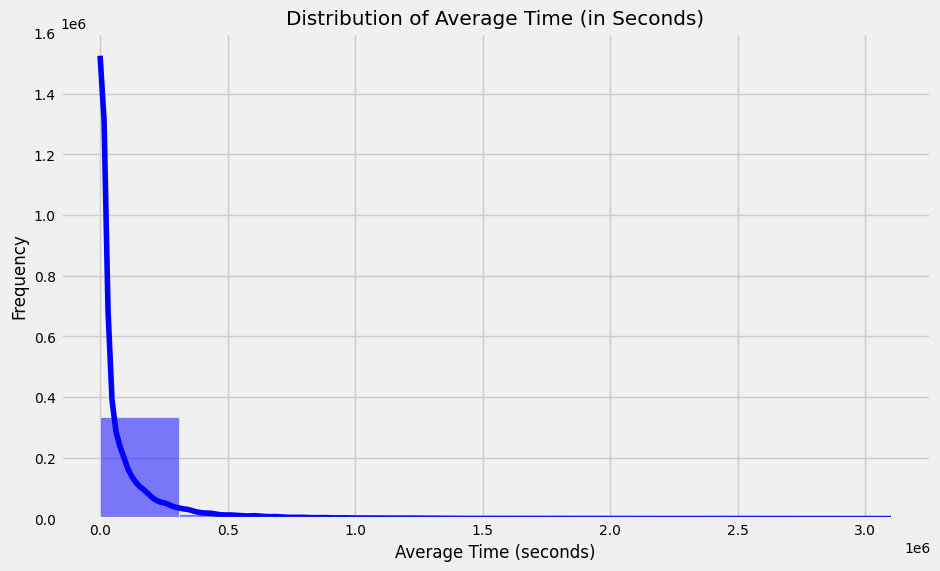

In [ ]:
# Vẽ biểu đồ phân bố trung bình thời gian truy cập
plt.figure(figsize=(10, 6))
sns.histplot(merged['avg_secs'], kde=True, bins=10, color='blue')
plt.title("Distribution of Average Time (in Seconds)")
plt.xlabel("Average Time (seconds)")
plt.ylabel("Frequency")
plt.show()

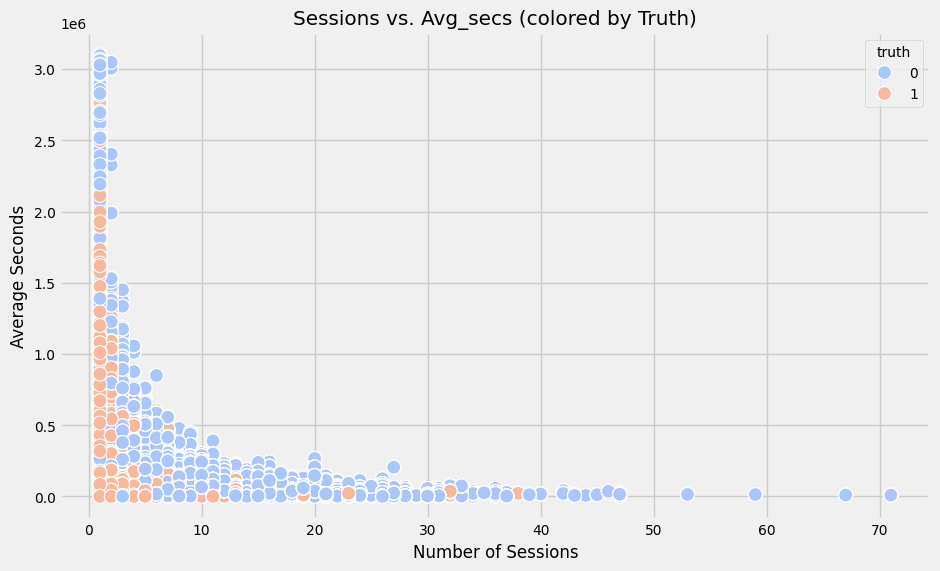

In [ ]:
# Vẽ biểu đồ tạn số giữa số sessions và thời gian trung bình, màu sắc theo 'truth'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='sessions', y='avg_secs', hue='truth', data=merged, palette='coolwarm', s=100)
plt.title("Sessions vs. Avg_secs (colored by Truth)")
plt.xlabel("Number of Sessions")
plt.ylabel("Average Seconds")
plt.show()

C:\Users\miynzi\AppData\Local\Temp\ipykernel_15984\992949146.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='truth', y='avg_secs', data=merged, palette='viridis')


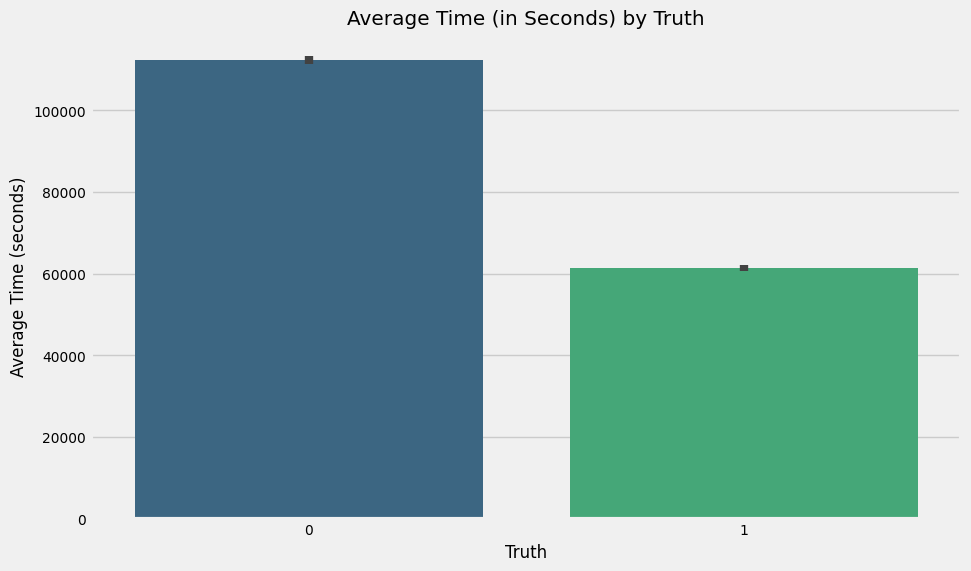

In [ ]:
# Vẽ biểu đồ thanh thể hiện thời gian trung bình theo 'truth'
plt.figure(figsize=(10, 6))
sns.barplot(x='truth', y='avg_secs', data=merged, palette='viridis')
plt.title("Average Time (in Seconds) by Truth")
plt.xlabel("Truth")
plt.ylabel("Average Time (seconds)")
plt.show()

## Train Model based on Session

In [ ]:
# Chuẩn bị dữ liệu huấn luyện và nhãn
X = merged[['sessions', 'avg_secs']]
y = merged['truth']

In [ ]:
# Đếm số dòng dữ liệu
X.count()
y.count()

np.int64(358922)

In [ ]:
X.count()

sessions    358922
avg_secs    358922
dtype: int64

In [ ]:
y.count()

np.int64(358922)

In [ ]:
# Import thư viện cần thiết
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Chia dữ liệu thành tập train và test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Huấn luyện mô hình XGBoost
model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
model.fit(X_train, y_train)

# Dự đoán kết quả và đánh giá mô hình
y_pred = model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("Accuracy Score:")
print(accuracy_score(y_test, y_pred))

C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:30:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.78      0.78     33285
           1       0.81      0.80      0.81     38500

    accuracy                           0.79     71785
   macro avg       0.79      0.79      0.79     71785
weighted avg       0.79      0.79      0.79     71785

Confusion Matrix:
[[26012  7273]
 [ 7518 30982]]
Accuracy Score:
0.793954168698196


In [ ]:
# Tính trung bình thời gian truy cập theo truth
merged_data = train_sessions_avg.merge(train_y, on='enroll_id', how='left')
merged_data.head()
avg_time_by_dropout = merged_data.groupby('truth')['avg_secs'].mean()
print(avg_time_by_dropout)

truth
0    180017.706844
1     61760.322276
Name: avg_secs, dtype: float64


In [ ]:
# Thiết lập ngưỡng thời gian dựa trên nhóm không dropout
threshold = avg_time_by_dropout[0]  # Trung bình thời gian cho nhóm không dropout
print(f"Time threshold: {threshold} seconds")

Time threshold: 180017.70684419927 seconds


# Explanatory Modeling

In [ ]:
# Phân tích hồi quy tuyến tính
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [ ]:
# Loại bỏ null values và chuyển sang kiểu numeric
print("Initial dtypes of train_full_nona:")
print(train_full_nona.dtypes)
train_full_nona = train_full_nona.dropna()
train_full_nona = train_full_nona.apply(pd.to_numeric, errors='coerce')
print("Dtypes after conversion to numeric:")
print(train_full_nona.dtypes)

# Xác nhận các cột không phải số để loại bỏ
non_numeric_cols = train_full_nona.select_dtypes(exclude=['number']).columns
if not non_numeric_cols.empty:
    print(f"Removing non-numeric columns: {non_numeric_cols.tolist()}")
    train_full_nona = train_full_nona.drop(columns=non_numeric_cols)

# Đồng bộ dữ liệu truth với train_full_nona
train_y_aligned = train_y.loc[train_full_nona.index]
if train_y_aligned['truth'].isna().any():
    print("train_y_aligned['truth'] contains NaN values.")
    train_y_aligned = train_y_aligned.dropna(subset=['truth'])

train_y_aligned['truth'] = pd.to_numeric(train_y_aligned['truth'], errors='coerce')

# Kiểm tra null values sau khi xử lý
def check_null(data):
    if data.isna().any().any():
        raise ValueError(f"{data.name} still contains NaN values after processing.")

check_null(train_full_nona)
check_null(train_y_aligned)

# Xây dựng mô hình GLM
mod1 = sm.GLM(
    endog=train_y_aligned['truth'],
    exog=train_full_nona.drop(columns=['enroll_id']),  # Loại bỏ cột enroll_id
    family=sm.families.Binomial()
).fit()

# Lọc hàm hồi quy có ý nghĩa thống kê (P-value < 0.05)
significant_coefficients = (
    mod1.summary2().tables[1][mod1.summary2().tables[1]['P>|z|'] < 0.05]
    .sort_values('Coef.', ascending=False)
)

print("Significant Coefficients:")
print(significant_coefficients)

# In tóm tắt mô hình và AIC
print("Model Summary:")
print(mod1.summary())
print("AIC:", mod1.aic)

Initial dtypes of train_full_nona:
enroll_id                    int64
click_about                float64
click_courseware           float64
click_forum                float64
click_info                 float64
                            ...   
category_math                 bool
category_medicine             bool
category_philosophy           bool
category_physics              bool
category_social science       bool
Length: 87, dtype: object
Dtypes after conversion to numeric:
enroll_id                    int64
click_about                float64
click_courseware           float64
click_forum                float64
click_info                 float64
                            ...   
category_math                 bool
category_medicine             bool
category_philosophy           bool
category_physics              bool
category_social science       bool
Length: 87, dtype: object
Removing non-numeric columns: ['first_action_click_courseware', 'first_action_click_forum', 'first_action_c

coef hệ số hồi quy từng biến

std err  sai số chuẩn của hệ số ước lượng

z: Giá trị thống kê z dùng để kiểm định mức ý nghĩa của hệ số (hệ số có khác 0 không).

P>|z|: Giá trị p để kiểm định giả thuyết H0: coef = 0 (không có mối quan hệ giữa biến giải thích và biến mục tiêu).

Giá trị p thấp (ví dụ, nhỏ hơn 0.05) cho thấy biến này có ý nghĩa thống kê trong mô hình.

[0.025, 0.975]: Khoảng tin cậy 95% cho hệ số, cung cấp phạm vi mà hệ số có thể thay đổi với xác suất 95%.

Ví dụ về một số biến trong output:

click_about (coef = 0.0319, p < 0.05): Hành động click_about có hệ số dương và có ý nghĩa thống kê, tức là khi người dùng thực hiện hành động này, xác suất biến truth có giá trị 1 sẽ tăng.

create_thread (coef = -0.1433, p < 0.05): Hành động create_thread có hệ số âm và có ý nghĩa thống kê, cho thấy khi người dùng thực hiện hành động này, xác suất của biến truth có giá trị 1 giảm.

close_forum (coef = -20.7253, p = 1.0): Hệ số âm rất lớn và không có ý nghĩa thống kê (p-value = 1), có thể là một dấu hiệu rằng biến này không đóng góp ý nghĩa vào mô hình hoặc có thể có vấn đề về số lượng quan sát trong nhóm này.


In [ ]:
# Lọc ra các hệ số hồi quy từ mô hình mod1 có giá trị P nhỏ hơn 0.05
# và sắp xếp các hệ số theo thứ tự giảm dần.
mod1.summary2().tables[1][mod1.summary2().tables[1]['P>|z|'] < 0.05].sort_values('Coef.', ascending=False)

,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
create_thread,8.312663e-02,3.524597e-02,2.358472,1.835036e-02,1.404579e-02,1.522075e-01
age,3.790378e-02,5.757064e-04,65.838740,0.000000e+00,3.677542e-02,3.903215e-02
sessions,3.581153e-02,6.184411e-03,5.790613,7.012995e-09,2.369031e-02,4.793276e-02
click_about,8.371043e-03,2.734505e-03,3.061265,2.204042e-03,3.011512e-03,1.373057e-02
pause_video,4.674740e-03,1.005724e-03,4.648132,3.349544e-06,2.703556e-03,6.645924e-03
close_courseware,4.055440e-03,9.659186e-04,4.198532,2.686509e-05,2.162275e-03,5.948606e-03
load_video,2.347687e-03,9.820655e-04,2.390560,1.682269e-02,4.228736e-04,4.272500e-03
avg_secs,1.935308e-07,4.563744e-08,4.240615,2.229078e-05,1.040831e-07,2.829785e-07
click_courseware,-3.163614e-03,5.874392e-04,-5.385432,7.227086e-08,-4.314973e-03,-2.012254e-03
click_info,-5.007435e-03,2.072695e-03,-2.415905,1.569615e-02,-9.069843e-03,-9.450271e-04


Việc lọc và sắp xếp các biến này giúp dễ dàng nhận biết các yếu tố quan trọng ảnh hưởng đến dự đoán của mô hình và có thể dẫn đến những quyết định hành động hoặc hướng nghiên cứu tiếp theo.

## Sequence Pattern Mining

In [ ]:
# Cài đặt thư viện PrefixSpan
!pip3 install -U prefixspan
from prefixspan import PrefixSpan

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
# Chuẩn bị các chuỗi hành động theo nhóm dropout và non-dropout

dropout_actions = eda_info[eda_info['truth'] == 1][['enroll_id', 'action', 'time']].sort_values(['enroll_id', 'time']).reset_index(drop=True)
nondropout_actions = eda_info[eda_info['truth'] == 0][['enroll_id', 'action', 'time']].sort_values(['enroll_id', 'time']).reset_index(drop=True)

In [ ]:
# Nhóm các hành động trong DataFrame dropout_actions theo 'enroll_id'
# và chuyển đổi các hành động thành danh sách cho từng 'enroll_id',
# sau đó tạo ra một danh sách chứa tất cả các danh sách hành động.
dropout_actions_db = dropout_actions.groupby('enroll_id')['action'].apply(list).tolist()

In [ ]:
# Gộp các hành động làm danh sách cho mỗi enroll_id

dropout_actions_db = dropout_actions.groupby('enroll_id')['action'].apply(list).tolist()
nondropout_actions_db = nondropout_actions.groupby('enroll_id')['action'].apply(list).tolist()

In [ ]:
# Thống kê số lượng dropout và non-dropout
print("Dropouts: " + str(len(dropout_actions_db)))
print("Non-Dropouts: " + str(len(nondropout_actions_db)))

Dropouts: 119817
Non-Dropouts: 38126


#### Weighted Random Sampling

In [ ]:
# Tính toán thống kê số lượng hành động trên mỗi người dùng (enroll_id)
eda_info.groupby('enroll_id')['action'].count().describe

<bound method NDFrame.describe of enroll_id
772        2
773       21
774       74
776       19
777        4
          ..
466774    42
466776    19
466781    29
466782    24
466786    93
Name: action, Length: 157943, dtype: int64>

Kết quả cho thấy sự chênh lệch lớn trong số lượng hành động giữa các enroll_id. Một số enroll_id có số lượng hành động rất lớn, trong khi nhiều enroll_id chỉ có vài hành động, cho thấy dữ liệu này có phân phối lệch với một số giá trị ngoại lệ rất cao.

In [ ]:
# Hàm WRS (Weighted Random Sampling) sử dụng phân phối Dirichlet để ưu tiên các trọng số cao
def wrs(pop, k):
    weights = np.random.dirichlet(np.ones_like(pop, dtype='int'))  # Tạo trọng số Dirichlet
    v = [np.random.random() ** (1 / w) for w in weights]  # Tạo giá trị ngẫu nhiên theo trọng số
    order = sorted(range(len(pop)), key=lambda i: v[i])  # Sắp xếp theo giá trị ngẫu nhiên
    return [pop[i] for i in order[-k:]]  # Chọn k phần tử cuối cùng (ưu tiên trọng số cao)

Hàm wrs thực hiện lấy mẫu có trọng số ngẫu nhiên, chọn k phần tử từ danh sách pop với xác suất được điều chỉnh theo phân phối Dirichlet. Cách lấy mẫu này giúp chọn các phần tử với xác suất ngẫu nhiên, ưu tiên các phần tử có trọng số cao hơn trong quá trình lấy mẫu.

Hàm này là để thực hiện chọn lọc ngẫu nhiên có trọng số từ một danh sách, có thể hữu ích trong các tình huống mà bạn muốn chọn các phần tử với xác suất không đồng đều

In [ ]:
# Lấy mẫu ngẫu nhiên có trọng số cho hành động của người dùng bỏ học (dropouts)
dropout_actions_wrs = list(map(lambda x: wrs(x, k=138), dropout_actions_db))

# Lấy mẫu ngẫu nhiên có trọng số cho hành động của người dùng không bỏ học (non-dropouts)
nondropout_actions_wrs = list(map(lambda x: wrs(x, k=138), nondropout_actions_db))

#### Frequent Sequence Sets

In [ ]:
# Áp dụng thuật toán PrefixSpan để tìm mẫu tuần tự trong dữ liệu người bỏ học
dropout_ps = PrefixSpan(dropout_actions_wrs)
# Áp dụng thuật toán PrefixSpan để tìm mẫu tuần tự trong dữ liệu người không bỏ học
nondropout_ps = PrefixSpan(nondropout_actions_wrs)  #59909 ~ 50%, tim chuoi hanh dong cua học sinh bỏ học , chỉ giữ lại chuổi phổ biến cáo

In [ ]:
# Tìm các mẫu tuần tự phổ biến với ngưỡng tần suất tối thiểu
dropout_freq = dropout_ps.frequent(59909, closed=True)  # Với người bỏ học
sorted(filter(lambda x: len(x[1]) > 1, dropout_freq), reverse=True)  # Lọc và sắp xếp

[(70735, ['load_video', 'load_video']),
 (70631, ['load_video', 'pause_video']),
 (70495, ['pause_video', 'load_video']),
 (65580, ['load_video', 'close_courseware']),
 (65526, ['close_courseware', 'load_video']),
 (64166, ['pause_video', 'pause_video']),
 (60834, ['click_courseware', 'click_courseware']),
 (60788, ['click_about', 'click_about'])]

In [ ]:
nondropout_freq = nondropout_ps.frequent(28595, closed=True)  # Với người không bỏ học
sorted(filter(lambda x: len(x[1]) > 1, nondropout_freq), key=lambda x: (len(x[1]), x[0]), reverse=True)

[(29293, ['load_video', 'load_video', 'load_video']),
 (29119, ['pause_video', 'load_video', 'load_video']),
 (29116, ['load_video', 'pause_video', 'load_video']),
 (29108, ['pause_video', 'pause_video', 'load_video']),
 (29074, ['load_video', 'pause_video', 'pause_video']),
 (29063, ['load_video', 'load_video', 'pause_video']),
 (29029, ['pause_video', 'load_video', 'pause_video']),
 (28748, ['pause_video', 'pause_video', 'pause_video']),
 (31736, ['load_video', 'load_video']),
 (31139, ['pause_video', 'load_video']),
 (31111, ['load_video', 'pause_video']),
 (30815, ['load_video', 'close_courseware']),
 (30814, ['close_courseware', 'load_video']),
 (30452, ['pause_video', 'pause_video']),
 (29835, ['close_courseware', 'close_courseware']),
 (29645, ['pause_video', 'close_courseware']),
 (29553, ['close_courseware', 'pause_video']),
 (28839, ['click_courseware', 'click_courseware'])]

## Predictive Modeling

In [ ]:
# Tắt các cảnh báo không cần thiết (ConvergenceWarning, FutureWarning)
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
warnings.filterwarnings(action='ignore', category=FutureWarning)

In [ ]:
# Import các mô hình học máy để huấn luyện và đánh giá
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
!pip install xgboost
from xgboost import XGBClassifier

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
# Khởi tạo các mô hình học máy
lr = LogisticRegression()                     # Hồi quy Logistic
dt = DecisionTreeClassifier()                 # Cây quyết định
rf = RandomForestClassifier()                 # Rừng ngẫu nhiên
mlp = MLPClassifier()                         # Mạng nơ-ron đa lớp
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')  # XGBoost

In [ ]:
# Khởi tạo k-fold để đánh giá mô hình (4 lần chia tập dữ liệu)
skf = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

In [ ]:
# Đánh giá hiệu suất của từng mô hình trên tập dữ liệu train_behavior
lr_score = cross_validate(lr, train_behavior.drop(columns=['enroll_id']), train_y['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
dt_score = cross_validate(dt, train_behavior.drop(columns=['enroll_id']), train_y['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
rf_score = cross_validate(rf, train_behavior.drop(columns=['enroll_id']), train_y['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
mlp_score = cross_validate(mlp, train_behavior.drop(columns=['enroll_id']), train_y['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
xgb_score = cross_validate(xgb, train_behavior.drop(columns=['enroll_id']), train_y['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)

C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(sm

In [ ]:
# Đánh giá hiệu suất sau khi loại bỏ dữ liệu không đầy đủ (train_full_nona)
train_y_filtered = train_y[train_y['enroll_id'].isin(train_full_nona['enroll_id'])]
lr_score_nona = cross_validate(lr, train_full_nona.drop(columns=['enroll_id']), train_y_filtered['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
dt_score_nona = cross_validate(dt, train_full_nona.drop(columns=['enroll_id']), train_y_filtered['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
rf_score_nona = cross_validate(rf, train_full_nona.drop(columns=['enroll_id']), train_y_filtered['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
mlp_score_nona = cross_validate(mlp, train_full_nona.drop(columns=['enroll_id']), train_y_filtered['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
xgb_score_nona = cross_validate(xgb, train_full_nona.drop(columns=['enroll_id']), train_y_filtered['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)

C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(sm

In [ ]:
# So sánh hiệu suất mô hình dựa trên Accuracy và F1 Score
print('Model Scores (train_behavior)')
pd.DataFrame({
    'Model': ['LR', 'DT', 'RF', 'MLP', 'XGB'],
    'Accuracy': [lr_score['test_accuracy'].mean(), dt_score['test_accuracy'].mean(), rf_score['test_accuracy'].mean(), mlp_score['test_accuracy'].mean(), xgb_score['test_accuracy'].mean()],
    'F1': [lr_score['test_f1'].mean(), dt_score['test_f1'].mean(), rf_score['test_f1'].mean(), mlp_score['test_f1'].mean(), xgb_score['test_f1'].mean()]
}).sort_values('F1', ascending=False)

print('Model Scores (train_full_nona)')
pd.DataFrame({
    'Model': ['LR', 'DT', 'RF', 'MLP', 'XGB'],
    'Accuracy': [lr_score_nona['test_accuracy'].mean(), dt_score_nona['test_accuracy'].mean(), rf_score_nona['test_accuracy'].mean(), mlp_score_nona['test_accuracy'].mean(), xgb_score_nona['test_accuracy'].mean()],
    'F1': [lr_score_nona['test_f1'].mean(), dt_score_nona['test_f1'].mean(), rf_score_nona['test_f1'].mean(), mlp_score_nona['test_f1'].mean(), xgb_score_nona['test_f1'].mean()]
}).sort_values('F1', ascending=False)

Model Scores (train_behavior)
Model Scores (train_full_nona)


,Model,Accuracy,F1
4,XGB,0.820553,0.884280
2,RF,0.820272,0.883290
0,LR,0.793343,0.871757
3,MLP,0.753888,0.840370
1,DT,0.734700,0.818958


In [ ]:
# Tìm tham số tối ưu cho mô hình XGBoost bằng GridSearchCV
params = {
    'min_child_weight': [1, 3, 5],
    'gamma': [0.1, 0.5],
    'max_depth': [3, 5]
}
grid_xgb = GridSearchCV(
    estimator=xgb,
    param_grid=params,
    cv=skf,
    scoring='accuracy',
    verbose=2
).fit(train_behavior.drop(columns=['enroll_id']), train_y['truth'])

Fitting 4 folds for each of 12 candidates, totalling 48 fits


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=3; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=3; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=3; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=3; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.1, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:36:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=1; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=3; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=3; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=3, min_child_weight=5; total time=   0.2s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=1; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=3; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END .........gamma=0.5, max_depth=5, min_child_weight=5; total time=   0.3s


C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Đây là dictionary chứa các giá trị cho các tham số sẽ được thử nghiệm trong quá trình tìm kiếm lưới (GridSearchCV).
min_child_weight: Được đặt các giá trị [1, 3, 5], đây là một tham số của XGBoost quy định trọng số tối thiểu mà một node con phải có để được phân chia.
gamma: Có các giá trị [0.1, 0.5], đây là tham số quyết định độ giảm tối thiểu cần thiết để phân chia một node, giúp kiểm soát độ phức tạp của mô hình.
max_depth: Có các giá trị [3, 5], quy định độ sâu tối đa của các cây trong XGBoost, giúp kiểm soát độ phức tạp của mô hình.

CV: Số lần cross-validation trên mỗi tổ hợp tham số.
gamma=X, max_depth=Y, min_child_weight=Z: Tổ hợp tham số hiện tại đang thử nghiệm.
total time= ...s: Tổng thời gian huấn luyện cho tổ hợp tham số này trong một lần cross-validation.
Ví dụ:

[CV] END .........gamma=0.1, max_depth=3, min_child_weight=1; total time= 13.4s
Thực hiện huấn luyện với gamma=0.1, max_depth=3, và min_child_weight=1, và thời gian hoàn thành là 13.4 giây.

In [ ]:
# In ra tham số tối ưu và tạo mô hình XGBoost cuối cùng
print(grid_xgb.best_params_)
xgb_final = XGBClassifier(**grid_xgb.best_params_, use_label_encoder=False, eval_metric='logloss')

{'gamma': 0.1, 'max_depth': 3, 'min_child_weight': 5}


In [ ]:
# Sử dụng cross_validate để kiểm tra độ chính xác và F1 của mô hình XGBoost tốt nhất (xgb_final)
xgb_final_score = cross_validate(xgb_final, train_behavior.drop(columns=['enroll_id']), train_y['truth'], cv=skf, scoring=["accuracy", "f1"], return_train_score=True)
print(f"Accuracy: {xgb_final_score['test_accuracy'].mean()}")
print(f"F1: {xgb_final_score['test_f1'].mean()}")

C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(sm

Accuracy: 0.8440893277142367
F1: 0.9018680229310224


#### Evaluating Predictions

In [ ]:
# Xử lý dữ liệu kiểm tra: Tính toán số lượng hành động theo từng 'enroll_id' và chuyển đổi thành ma trận
test_actions = test.groupby('enroll_id')['action'].value_counts().unstack().fillna(0).reset_index()

In [ ]:
# Sắp xếp dữ liệu kiểm tra theo thứ tự 'enroll_id' và 'time'
test_sorted = test.sort_values(['enroll_id', 'time'])

In [ ]:
# Trích xuất hành động đầu tiên và cuối cùng của mỗi 'enroll_id', sau đó chuyển đổi thành biến giả
test_actions_fl = pd.get_dummies(
    test_sorted.groupby('enroll_id')['action'].agg(first_action='first', last_action='last').reset_index(),
    drop_first=True
)

In [ ]:
# Chuyển đổi cột 'time' sang định dạng datetime để xử lý thời gian
test['time'] = pd.to_datetime(test['time'])

In [ ]:
# Tính thời gian trung bình của mỗi phiên làm việc theo từng 'enroll_id'
test_sessions = test.groupby(['enroll_id', 'session_id'])['time'].agg(np.ptp).reset_index()
test_sessions_avg = test_sessions.groupby('enroll_id')['time'].agg(avg_time='mean', sessions='count').reset_index()
test_sessions_avg['avg_secs'] = test_sessions_avg['avg_time'].dt.total_seconds()

In [ ]:
# Ghép thông tin người dùng từ bảng 'user_info_nona'
enroll_dict = test[['enroll_id', 'username']].drop_duplicates(subset=['enroll_id'])
test_users = enroll_dict.merge(user_info_nona, left_on="username", right_on="user_id")

In [ ]:
# Ghép thông tin khóa học từ bảng 'course_info_nona'
course_dict = test[['enroll_id', 'course_id']].drop_duplicates(subset=['enroll_id'])
test_courses = course_dict.merge(course_info_nona[['course_id', 'course_type', 'category']], on="course_id")

In [ ]:
# Kết hợp các thông tin về hành vi, hành động đầu tiên/cuối cùng, và phiên làm việc
test_behavior = test_actions.merge(
    test_actions_fl.merge(test_sessions_avg[['enroll_id', 'sessions', 'avg_secs']], on='enroll_id'),
    on='enroll_id'
)

In [ ]:
# Kiểm tra kích thước của dữ liệu kiểm tra
test_behavior.shape

(67699, 61)

In [ ]:
# Tìm và thêm các cột bị thiếu trong dữ liệu kiểm tra
set(train_behavior.columns) - set(test_behavior.columns)
test_behavior.insert(30, 'first_action_delete_comment', 0)
test_behavior.insert(39, 'first_action_reset_problem', 0)

In [ ]:
# Huấn luyện lại mô hình XGBoost với dữ liệu huấn luyện đầy đủ
xgb_final.fit(train_behavior.drop(columns=['enroll_id']), train_y['truth'])

C:\Users\miynzi\AppData\Roaming\Python\Python312\site-packages\xgboost\core.py:158: UserWarning: [16:37:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=5, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Hiển thị tầm quan trọng của các đặc trưng được mô hình XGBoost tính toán
pd.DataFrame({'feature': train_behavior.drop(columns=['enroll_id']).columns, 'importance': xgb_final.feature_importances_}).sort_values('importance', ascending=False).head(10)

,feature,importance
60,sessions,0.390316
15,problem_check_correct,0.143239
11,load_video,0.139343
1,click_courseware,0.043893
21,stop_video,0.035615
61,avg_secs,0.035390
41,last_action_click_courseware,0.018273
35,first_action_problem_check_incorrect,0.014453
14,problem_check,0.013570
16,problem_check_incorrect,0.013336


In [ ]:
# Lấy danh sách các cột trong dữ liệu kiểm tra
test_behavior.columns

Index(['enroll_id', 'click_about', 'click_courseware', 'click_forum',
       'click_info', 'click_progress', 'close_courseware', 'close_forum',
       'create_comment', 'create_thread', 'delete_comment', 'delete_thread',
       'load_video', 'pause_video', 'play_video', 'problem_check',
       'problem_check_correct', 'problem_check_incorrect', 'problem_get',
       'problem_save', 'reset_problem', 'seek_video', 'stop_video',
       'first_action_click_courseware', 'first_action_click_forum',
       'first_action_click_info', 'first_action_click_progress',
       'first_action_close_courseware', 'first_action_create_comment',
       'first_action_create_thread', 'first_action_delete_comment',
       'first_action_load_video', 'first_action_pause_video',
       'first_action_play_video', 'first_action_problem_check',
       'first_action_problem_check_correct',
       'first_action_problem_check_incorrect', 'first_action_problem_get',
       'first_action_problem_save', 'first_action_re

In [ ]:
# Dự đoán kết quả trên dữ liệu kiểm tra
y_pred = xgb_final.predict(test_behavior.drop(columns=['enroll_id']))

In [ ]:
# Tính toán các chỉ số đánh giá: độ chính xác, F1 và ma trận nhầm lẫn
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
print("Accuracy: " + str(accuracy_score(test_y['truth'], y_pred)))
print("F1: " + str(f1_score(test_y['truth'], y_pred)))

Accuracy: 0.8416372472266946
F1: 0.9002725505334734


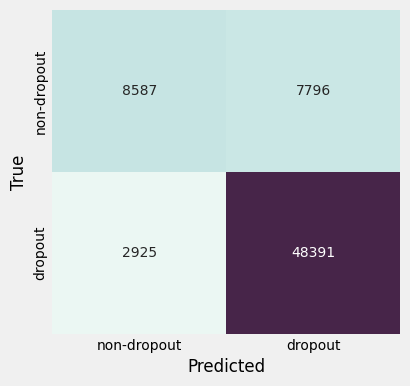

In [ ]:
# Hiển thị ma trận nhầm lẫn với seaborn heatmap
cm = confusion_matrix(test_y['truth'], y_pred)
plt.figure(figsize=(4,4))
ax = sns.heatmap(
    cm, annot=True, fmt='g',
    cmap=sns.cubehelix_palette(start=.7, rot=-.5, light=0.95, dark=0.2, as_cmap=True),
    cbar=False
)
ax.set_xlabel('Predicted'); ax.set_ylabel('True');
ax.xaxis.set_ticklabels(['non-dropout', 'dropout']); ax.yaxis.set_ticklabels(['non-dropout', 'dropout']);